# **ELEC 877 Research Project:**
# Detecting AI-Generated Text Using BERT Embeddings with Different ML Classifiers
## By: Maahum Khan

#
Overview:
- Detecting AI-generated text in a scientific context (i.e. research abstracts).
- Using 3 different embedding methods: 2 BERT models — Mini-BERT/Mini-LM, 394-dimensional embeddings, and Base BERT, 768-dim embedding — and TF-IDF vectorization.
- Embedding models were each used and tested on 2 different datasets: Kaggle dataset (4100 samples) and Hugging Face dataset (used 14.3K samples). They were also evaluated on the full Hugging Face dataset, containing 28.6K samples (code on the bottom), but this was excluded from the report to maintain consistent experimental design and prevent redundancy (since results were almost identical to that of using the 14.3K samples).
- Dataset names given in report and in code block where datasets are loaded
- For each embedding model + Dataset combination, feed embeddings into one of 4 different binary classifiers: Logistic Regression, Random Forest, SVM, and MLP.
- Visualization methods: t-SNE, UMAP, and PCA (top 3 components, in both 2D and 3D from all angles). Different UMAP and PCA hyperparameters were tested (different number of components for PCA and neighbours for UMAP), and t-SNE was done both with PCA (the standard) and without PCA (just to see). Note that the final report included PCA with 50 components and t-SNE with PCA. UMAP was excluded from final report due to 7-page limit and because it provided roughly the same information as the t-SNEs but was less clear.


## Kaggle dataset & Mini-BERT Setup and Pre-Processing

In [ ]:
# Loading the Kaggle dataset
# Dataset: "GPT vs Human: A Corpus of Research Abstracts" by Helene Eriksen, from Kaggle

import kagglehub
import pandas as pd
import os

# Downloading dataset from Kaggle
path = kagglehub.dataset_download("heleneeriksen/gpt-vs-human-a-corpus-of-research-abstracts")
print("Path to dataset files: ", path)

# Get the CSV file from the dataset's folder
csv_files = [file for file in os.listdir(path) if file.endswith('.csv')]
csv_file = os.path.join(path, csv_files[0])

# Load the CSV file into a pandas dataframe
dataframe = pd.read_csv(csv_file)

# Check the first few rows and columns
print(dataframe.head())
print(dataframe.columns)

# Check class balance just to make sure it's not under- or over-learning one class
print("Class distribution:")
print(dataframe['is_ai_generated'].value_counts())


100%|██████████| 1.10M/1.10M [00:00<00:00, 57.2MB/s]

Extracting files...
Path to dataset files:  /root/.cache/kagglehub/datasets/heleneeriksen/gpt-vs-human-a-corpus-of-research-abstracts/versions/1


                                               title  \
0                 Are Advanced Potentials Anomalous?   
1                 Are Advanced Potentials Anomalous?   
2  An efficient centralized binary multicast netw...   
3  An efficient centralized binary multicast netw...   
4  Percolation transition in networks with degree...   

                                            abstract  ai_generated  \
0    Advanced electromagnetic potentials are indi...         False   
1  This research paper investigates the question ...          True   
2    We give an algorithm for finding network enc...         False   
3  The paper presents an efficient centralized bi...          True   
4    We introduce an exponential random graph mod...         False   

   is_ai_generated  
0                0  
1                1  
2                0  
3                1  
4                0  
Index(['title', 'abstract', 'ai_generated', 'is_ai_generated'], dtype='object')
Class distribution:
is_ai_generated


In [ ]:
# Kaggle dataset
# Preprocessing
# Combine title and abstract to it can take in whole text and pick up more patterns
dataframe['text'] = dataframe['title'] + ". " + dataframe['abstract']

# Remove whitespace + put text in lowercase to prevent model overfitting to
# random capslocks (since dataset somewhat small)
dataframe['text'] = dataframe['text'].str.lower().str.strip()

# Get features (text) and target (is_ai_generated column, 0 = human, 1 = ai)
X_text = dataframe['text'].tolist()
Y = dataframe['is_ai_generated'].values

In [ ]:
# Kaggle dataset
# Preprocessing
# Combine title and abstract to it can take in whole text and pick up more patterns
dataframe['text'] = dataframe['title'] + ". " + dataframe['abstract']

# Remove whitespace + put text in lowercase to prevent model overfitting to
# random capslocks (since dataset somewhat small)
dataframe['text'] = dataframe['text'].str.lower().str.strip()

# Get features (text) and target (is_ai_generated column, 0 = human, 1 = ai)
X_text = dataframe['text'].tolist()
Y = dataframe['is_ai_generated'].values

# Extracting BERT embeddings now!

# Imports for this part
from sentence_transformers import SentenceTransformer
import numpy as np

# Load sentence-transformer model all-MiniLM-L6-v2
model = SentenceTransformer('all-MiniLM-L6-v2')

# Convert text into emeddings
# Output: numpy array (num_samples, embedding_dim)
X_embeddings = model.encode(X_text, show_progress_bar=True)
print("Shape of embeddings: ", X_embeddings.shape)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/127 [00:00<?, ?it/s]

Shape of embeddings:  (4053, 384)


## Training and Evaluating Functions

In [ ]:
# Training and Evaluation functions + Running functions on Mini-BERT, Kaggle dataset

# Imports for this code block
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
import time
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt

# Split the Kaggle dataset into 80% training, 20% testing
# Setting a random state for reproducibility, stratifying on Y to maintain class distribution (which is pretty even)
X_train, X_test, Y_train, Y_test = train_test_split(X_embeddings, Y, test_size=0.2, random_state=19, stratify=Y)

# Just checking how many samples are in each
print("Number of training samples: ", X_train.shape[0])
print("Number of test samples: ", X_test.shape[0])

# Function to train Logistic Regression model, Random Foreest, SVM, and MLP
def train(log_regressor, random_forest, svm, mlp, X_train, Y_train):
  # Training the Logistic Regression classifier (the baseline when comparing)
  start_time = time.time()
  #log_regressor = LogisticRegression(max_iter=1000)
  log_regressor.fit(X_train, Y_train)
  end_time = time.time()
  time_taken = end_time - start_time
  print(f"Done training logistic regression model — Took Time (s): {time_taken}")

  # Training the Random Forest classifier
  start_time = time.time()
  #random_forest = RandomForestClassifier(n_estimators=100, random_state=19)
  random_forest.fit(X_train, Y_train)
  end_time = time.time()
  time_taken = end_time - start_time
  print(f"Done training random forest classifier — Took Time (s): {time_taken}")

  # Training the SVM (support vector machine)
  start_time = time.time()
  #svm = SVC(kernel='linear', probability=True, random_state=19)
  svm.fit(X_train, Y_train)
  end_time = time.time()
  time_taken = end_time - start_time
  print(f"Done SVM classifier — Took Time (s): {time_taken}")

  # Train a simple MLP classifier
  start_time = time.time()
  #mlp = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
  mlp.fit(X_train, Y_train)
  end_time = time.time()
  time_taken = end_time - start_time
  print(f"Done training simple MLP — Took Time (s): {time_taken}")

  return log_regressor, random_forest, svm, mlp
  # End of train() function



# Function for evaluating the classifiers
def evaluate(classifier, x_test, y_test, model_name="Model"):
  # Use classifier to predict class for all test samples
  y_pred = classifier.predict(x_test)

  # Calculate the accuracy, precision, recall, and F1 score
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)

  # Print results
  print(f"{model_name} EVALUATION:")
  print(f"\tAccuracy: {accuracy:.3f}")
  print(f"\tPrecision: {precision:.3f}")
  print(f"\tRecall: {recall:.3f}")
  print(f"\tF1 Score: {f1:.3f}")

  # Creating and showing the confusion matrix
  conf_matrix = confusion_matrix(y_test, y_pred)
  sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Human", "AI"], yticklabels=["Human", "AI"])
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title(f"{model_name} Confusion Matrix")
  plt.show()

  # Creating ROC curves and AUC
  if hasattr(classifier, "predict_proba"):
    # Probability for positive class (it's ai)
    y_scores = classifier.predict_proba(x_test)[:,1]
  else:
    y_scores = classifier.decision_function(x_test) # For SVMs cause they don't have predict_proba

  falsepos_rate, truepos_rate, thresholds = roc_curve(y_test, y_scores)
  auc = roc_auc_score(y_test, y_scores) # area under curve
  plt.figure(figsize=(8,6))
  plt.plot(falsepos_rate, truepos_rate, label=f"{model_name} (Area Under Curve = {auc:.3f})")
  plt.plot([0, 1], [0, 1], 'k--', label="Random Guess") # Adding random guess line for reference
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate")
  plt.title(f"{model_name} ROC Curve")
  plt.legend(loc='lower right')
  plt.grid(True)
  plt.show()
  # End of evaluate() function



## Mini-BERT & Kaggle dataset: Training and Evaluating

Done training logistic regression model — Took Time (s): 0.10065674781799316
Done training random forest classifier — Took Time (s): 10.4712495803833
Done SVM classifier — Took Time (s): 6.950564861297607
Done training simple MLP — Took Time (s): 3.3531992435455322
Logistic Regression Model EVALUATION:
	Accuracy: 0.879
	Precision: 0.887
	Recall: 0.859
	F1 Score: 0.873


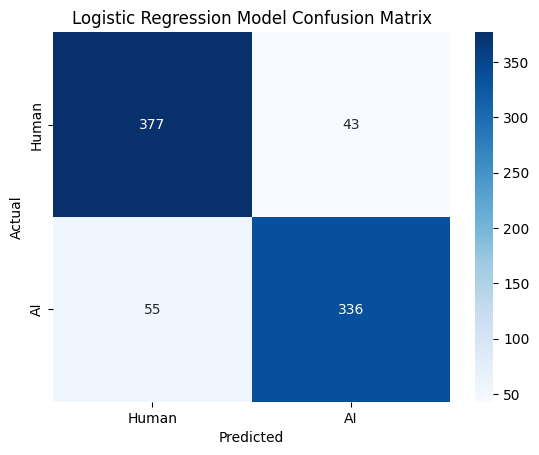

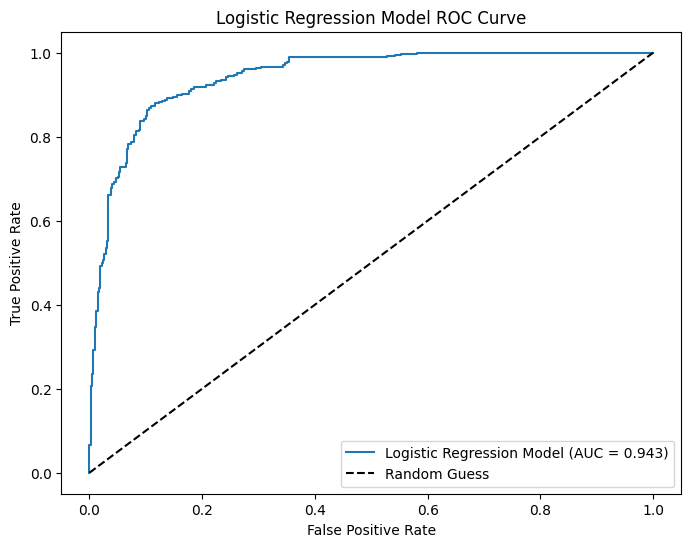

Random Forest Classifier EVALUATION:
	Accuracy: 0.799
	Precision: 0.803
	Recall: 0.772
	F1 Score: 0.787


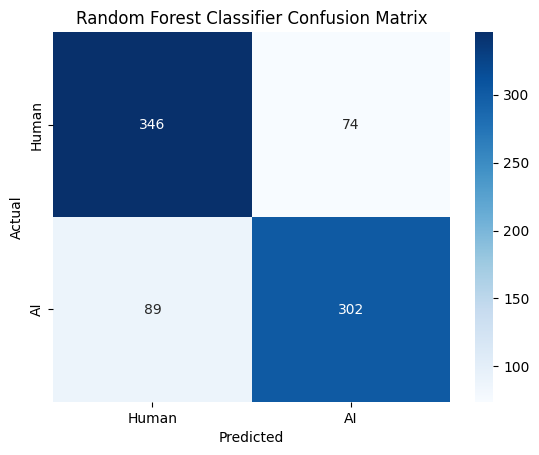

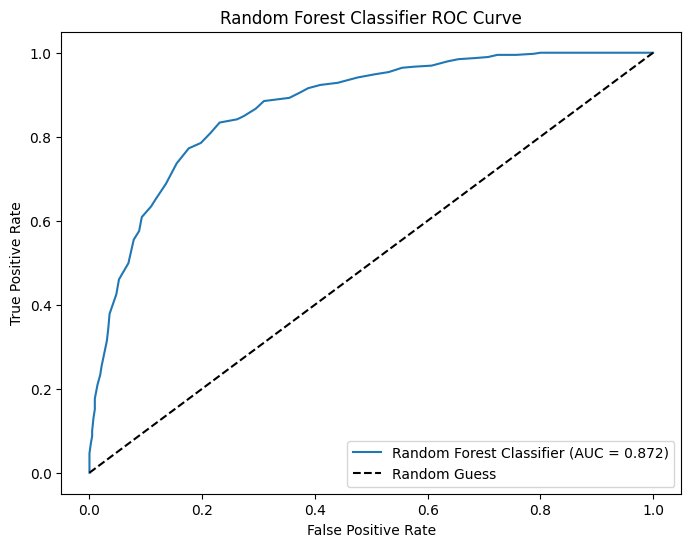

Linear Support Vector Machine EVALUATION:
	Accuracy: 0.891
	Precision: 0.896
	Recall: 0.877
	F1 Score: 0.886


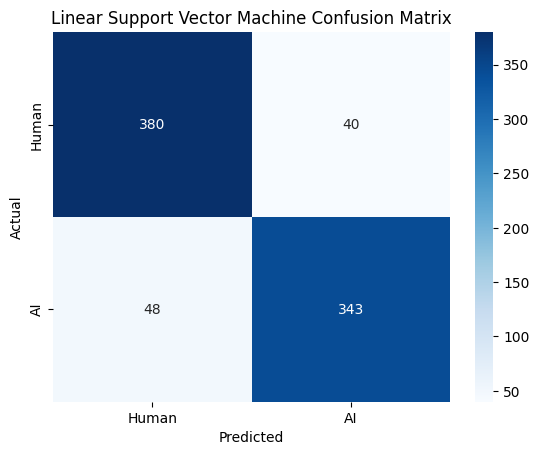

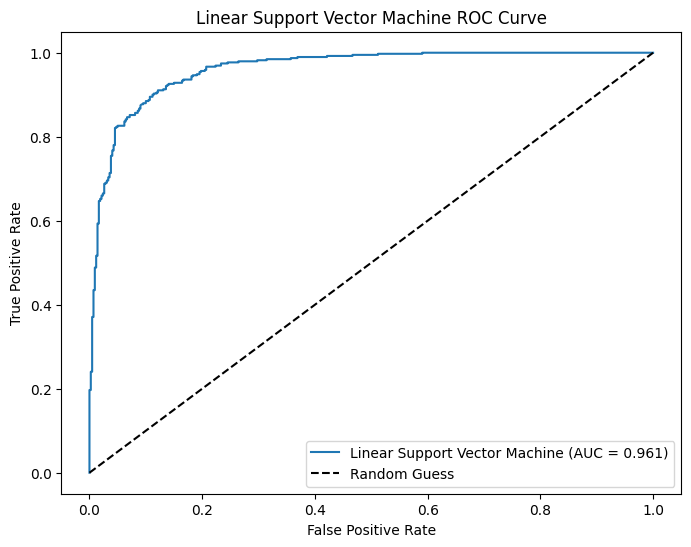

Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.905
	Precision: 0.909
	Recall: 0.893
	F1 Score: 0.901


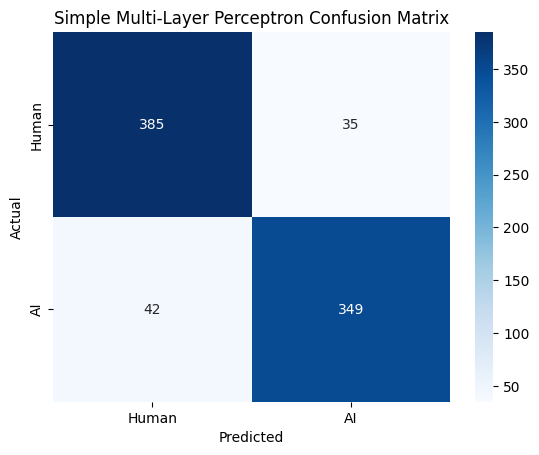

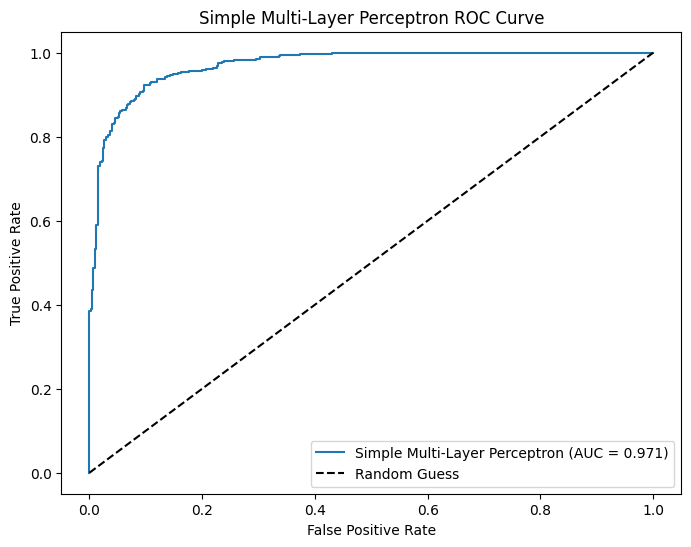

In [ ]:
# Mini-BERT model, Kaggle dataset

# Training the four regressors using Mini-BERT and Kaggle dataset
log_regressor = LogisticRegression(max_iter=1000)
random_forest = RandomForestClassifier(n_estimators=100, random_state=19)
svm = SVC(kernel='linear', probability=True, random_state=19)
mlp = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
log_regressor, random_forest, svm, mlp = train(log_regressor, random_forest, svm, mlp, X_train, Y_train)

# Evaluating the four models
evaluate(log_regressor, X_test, Y_test, "Logistic Regression Model")
evaluate(random_forest, X_test, Y_test, "Random Forest Classifier")
evaluate(svm, X_test, Y_test, "Linear Support Vector Machine")
evaluate(mlp, X_test, Y_test, "Simple Multi-Layer Perceptron")

## Defining Visualization Functions
- Note that not all figures will be included in report (max 7 pages), many of them are variations of one another or hyperparameter tuning just to see which ones provide the most relevant information and should be included in the final report.

In [ ]:
!pip install umap-learn --quiet

In [ ]:
# Visualization functions

# Imports for this section
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from mpl_toolkits.mplot3d import Axes3D

# Visualization (t-SNE and 2D UMAP) function
def visualize_2d(X_embeddings, dataframe, bert_name):
  # Reducing dimensionality with PCA first
  pca = PCA(n_components=50, random_state=19)
  X_pca = pca.fit_transform(X_embeddings)

  # t-SNE to 2D to visualize distribution in low dimensions
  tsne = TSNE(n_components=2, perplexity=30, n_iter=1000)
  X_tsne = tsne.fit_transform(X_pca)
  X_tsne_noPCA = tsne.fit_transform(X_embeddings)

  # Create the PCA-reduced t-SNE scatter plot with seaborn (sns)
  plt.figure(figsize=(10,6))
  sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=dataframe['label'], palette={0:"pink", 1:"purple"}, alpha=0.6)
  plt.title(f"t-SNE Visualization of {bert_name} Embeddings (WITH PCA)")
  plt.xlabel("Dimension 1")
  plt.ylabel("Dimension 2")
  plt.legend(title="Class", labels=["Human", "AI"])
  plt.show()

  # Create the t-SNE of embeddings scatter plot with seaborn (sns)
  plt.figure(figsize=(10,6))
  sns.scatterplot(x=X_tsne_noPCA[:,0], y=X_tsne_noPCA[:,1], hue=dataframe['label'], palette={0:"pink", 1:"purple"}, alpha=0.6)
  plt.title(f"t-SNE Visualization of {bert_name} Embeddings (NO PCA)")
  plt.xlabel("Dimension 1")
  plt.ylabel("Dimension 2")
  plt.legend(title="Class", labels=["Human", "AI"])
  plt.show()



In [ ]:
# Visualization function — UMAPs (will only use one)
# Comparing different UMAP n_neighbors values (higher values get more global structures, lower = local)
# Just looking for some useful information

# Function to get UMAPs of embeddings, with different number of neighbours
def get_umaps(X_embeddings, dataframe, model_name):
  # 50 Neighbours
  reducer = umap.UMAP(n_neighbors=50, min_dist=0.1)
  X_umap = reducer.fit_transform(X_embeddings)
  sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=dataframe['label'])
  plt.title(f"UMAP of {model_name} Embeddings (50 Neighbors)")
  plt.show()

  # 100 Neighbours
  reducer = umap.UMAP(n_neighbors=100, min_dist=0.1)
  X_umap = reducer.fit_transform(X_embeddings)
  sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=dataframe['label'])
  plt.title(f"UMAP of {model_name} Embeddings (100 Neighbours)")
  plt.show()

  # 200 Neighbours
  reducer = umap.UMAP(n_neighbors=200, min_dist=0.1)
  X_umap = reducer.fit_transform(X_embeddings)
  sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=dataframe['label'])
  plt.title(f"UMAP of {model_name} Embeddings (200 Neighbours)")
  plt.show()

  # 15 Neighbours
  reducer = umap.UMAP(n_neighbors=15, min_dist=0.1)
  X_umap = reducer.fit_transform(X_embeddings)
  sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=dataframe['label'])
  plt.title(f"UMAP of {model_name} Embeddings (15 Neighbours)")
  plt.show()

  # 2 Neighbours
  reducer = umap.UMAP(n_neighbors=2, min_dist=0.1)
  X_umap = reducer.fit_transform(X_embeddings)
  sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=dataframe['label'])
  plt.title(f"UMAP of {model_name} Embeddings (2 Neighbours)")
  plt.show()

In [ ]:
# Visualization functions – PCA
# From code block before this, 3D PCA of first 3 components looked like it might be useful
# So, now trying visualization of PCA with different components and dimensions

def pca_visualize(X_embeddings, dataframe, model_name, n_components=100):
  # Getting PCA embeddings
  pca = PCA(n_components=n_components, random_state=19)
  X_pca = pca.fit_transform(X_embeddings)

  # PCA Visualization of second and third PCA components
  plt.figure(figsize=(10,7))
  plt.scatter(X_pca[:,0], X_pca[:,1], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 2D PCA Components (x = 1st, y = 2nd)")
  plt.show()

  # Now visualizing second and third
  plt.figure(figsize=(10,7))
  plt.scatter(X_pca[:,1], X_pca[:,2], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 2D PCA Components (x = 2nd, y = 3rd)")
  plt.show()

  # Now first and third
  plt.figure(figsize=(10,7))
  plt.scatter(X_pca[:,0], X_pca[:,2], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 2D PCA Components (x = 1st, y = 3rd)")
  plt.show()

  # Trying 3D PCA visualization
  fig = plt.figure(figsize=(10,7))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(X_pca[:,0], X_pca[:,1], X_pca[:,2], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} Scatter Plot of PCA Components (x = 1st, y = 2nd, z = 3rd)")
  plt.show()

  # Trying 3D PCA visualization but changing order to 1st, 3rd, 2nd (x, y, z)
  fig = plt.figure(figsize=(10,7))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(X_pca[:,0], X_pca[:,2], X_pca[:,1], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 3D PCA Components (x = 1st, y = 3rd, z = 2nd)")
  plt.show()

  # Trying 3D PCA visualization but changing order to 2nd, 3rd, 1st (x, y, z)
  fig = plt.figure(figsize=(10,7))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(X_pca[:,1], X_pca[:,2], X_pca[:,0], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 3D PCA Components (x = 2nd, y = 3rd, z = 1st)")
  plt.show()

  # Trying 3D PCA visualization but changing order to 2nd, 1st, 3rd (x, y, z)
  fig = plt.figure(figsize=(10,7))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(X_pca[:,1], X_pca[:,0], X_pca[:,2], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 3D PCA Components (x = 2nd, y = 1st, z = 3rd)")
  plt.show()

  # Trying 3D PCA visualization but changing order to 3rd, 1st, 2nd (x, y, z)
  fig = plt.figure(figsize=(10,7))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(X_pca[:,2], X_pca[:,0], X_pca[:,1], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 3D PCA Components (x = 3rd, y = 1st, z = 2nd)")
  plt.show()

  # Trying 3D PCA visualization but changing order to 3rd, 2nd, 1st (x, y, z)
  fig = plt.figure(figsize=(10,7))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(X_pca[:,2], X_pca[:,1], X_pca[:,0], c=dataframe['label'], cmap='coolwarm', alpha=0.6)
  plt.title(f"{model_name} 3D PCA Components (x = 3rd, y = 2nd, z = 1st)")
  plt.show()
  # End of pca_visualize()


## Mini-BERT and Kaggle dataset: Visualizing

NOW SHOWING t-SNE, 3D PCA (x = 1st component, y = 2nd, z = 3rd)



/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


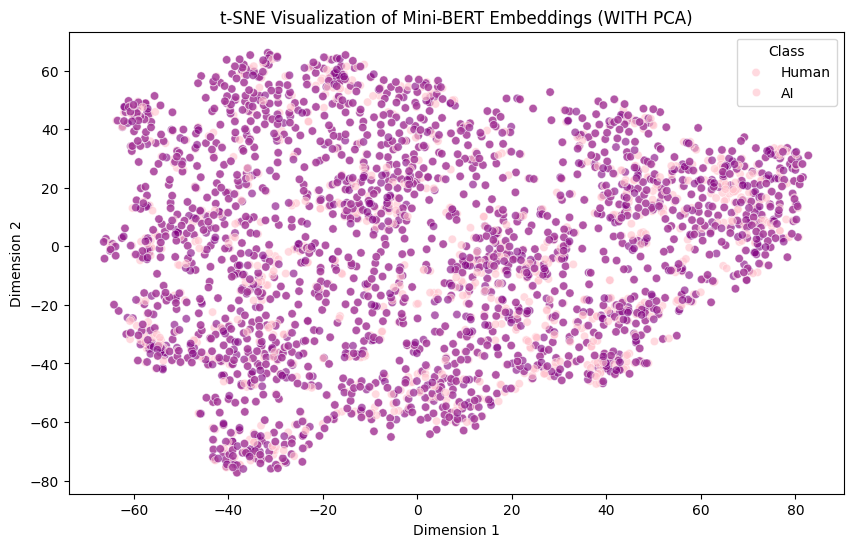

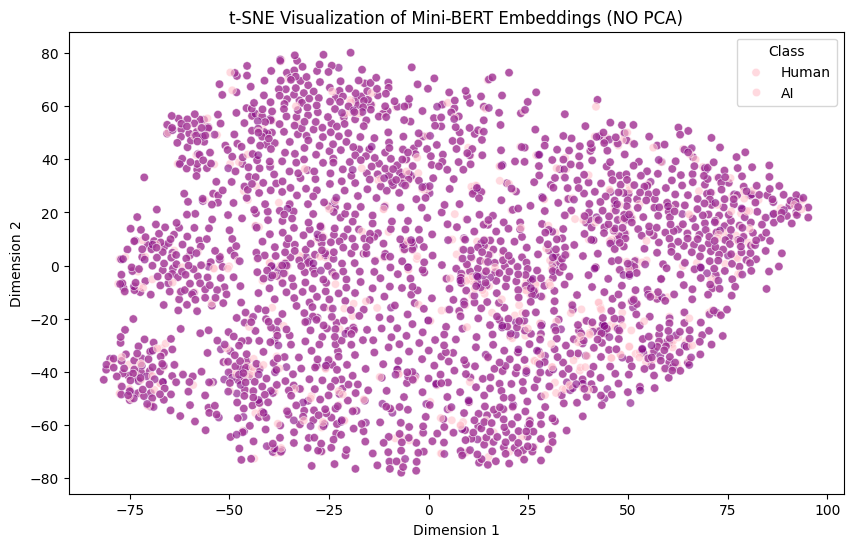

In [ ]:
# Mini-BERT, Kaggle dataset
# Calling 2D visualization function
print("NOW SHOWING t-SNE\n")
dataframe = dataframe.rename(columns={'is_ai_generated': 'label'})
visualize_2d(X_embeddings, dataframe, "Mini-BERT")


NOW SHOWING UMAPS



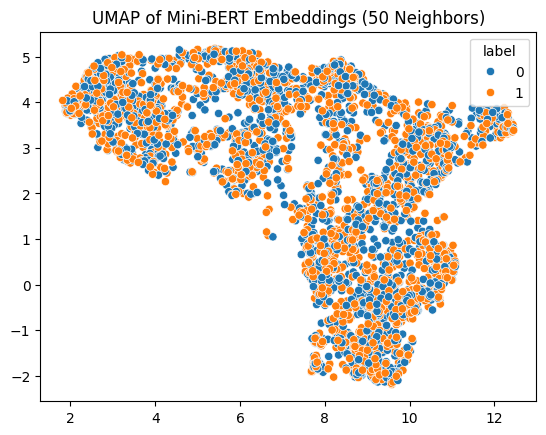

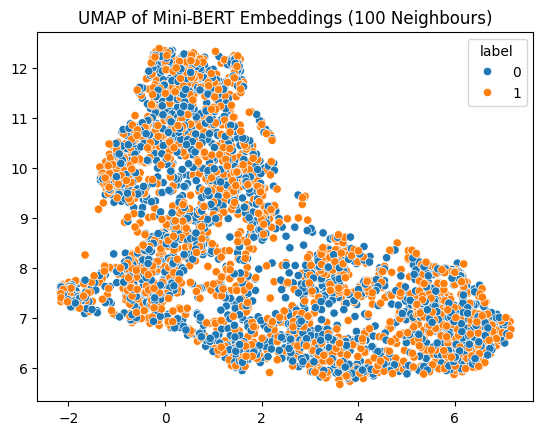

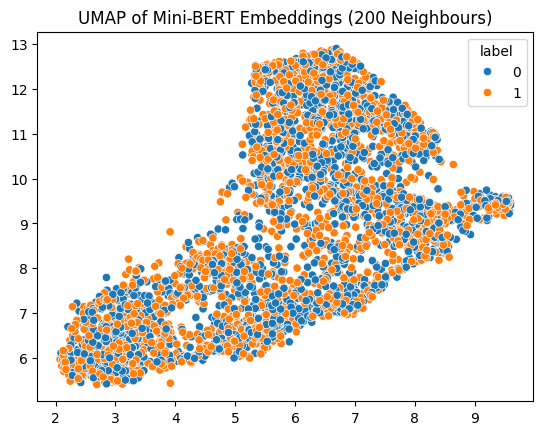

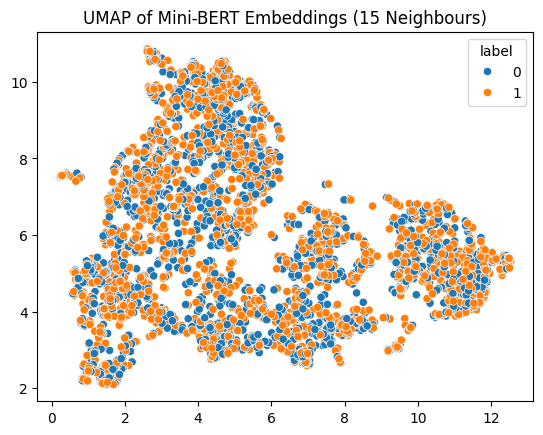

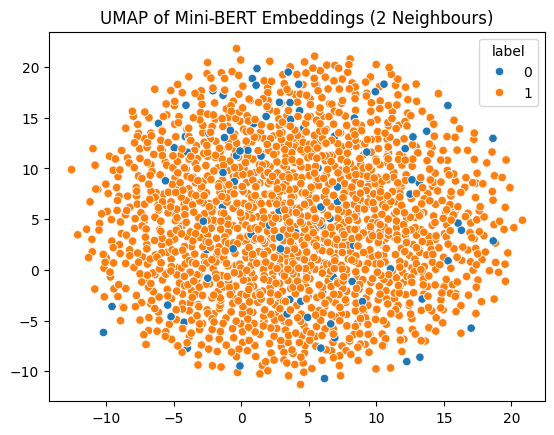

In [ ]:
# Mini-BERT, Kaggle dataset
# Calling UMAP visualization function
print("NOW SHOWING UMAPS\n")

get_umaps(X_embeddings, dataframe, "Mini-BERT")

In [ ]:
# Mini-BERT, Kaggle dataset
# Calling PCA visualization function for 50 components
print("NOW SHOWING PCA for 50 COMPONENTS")
pca_visualize(X_embeddings, dataframe, "Mini-BERT", 50)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Mini-BERT, Kaggle dataset
# Calling PCA visualization function for 100 components just to see if it makes a difference
print("NOW SHOWING PCA for 100 COMPONENTS")
pca_visualize(X_embeddings, dataframe, "Mini-BERT", 100)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Mini-BERT, Kaggle dataset
# Calling PCA visualization function for 200 components just to see if it makes a difference
print("NOW SHOWING PCA for 200 COMPONENTS")
pca_visualize(X_embeddings, dataframe, "Mini-BERT", 200)

Output hidden; open in https://colab.research.google.com to view.

### **Note:** 3 different PCA n_components were tested just to see if it affected visualization results but clearly it did not, so from now on, only 100 n_components will be visualized

## BERT (798-dim), Kaggle dataset:
## Creating BERT Embeddings of Kaggle data

In [ ]:
# BERT, Kaggle dataset
# Extracting Base BERT (768-dim) embeddings now!

# Load sentence-transformer model base BERT (768-dim)
base_bert_model = SentenceTransformer('bert-base-nli-mean-tokens')

# Getting embeddings on the original Kaggle dataset using Base BERT model
x_emb_bb = base_bert_model.encode(X_text, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_bb.shape)


Batches:   0%|          | 0/127 [00:00<?, ?it/s]

Shape of embeddings:  (4053, 768)


## BERT, Kaggle: Training and Evaluating

Done training logistic regression model — Took Time (s): 0.5959711074829102
Done training random forest classifier — Took Time (s): 13.208851337432861
Done SVM classifier — Took Time (s): 3.648829460144043
Done training simple MLP — Took Time (s): 3.9834249019622803
Logistic Regression Model EVALUATION:
	Accuracy: 0.979
	Precision: 0.970
	Recall: 0.987
	F1 Score: 0.978


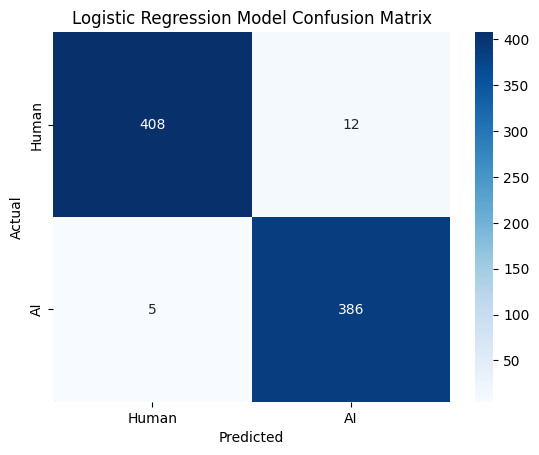

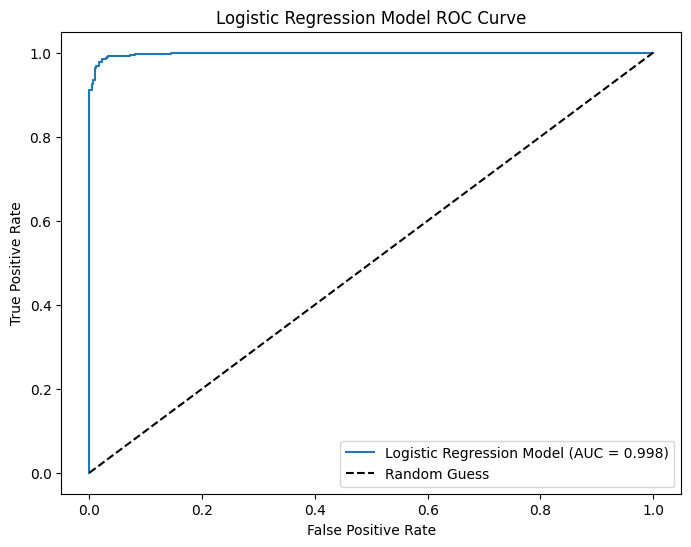

Random Forest Classifier EVALUATION:
	Accuracy: 0.898
	Precision: 0.897
	Recall: 0.890
	F1 Score: 0.893


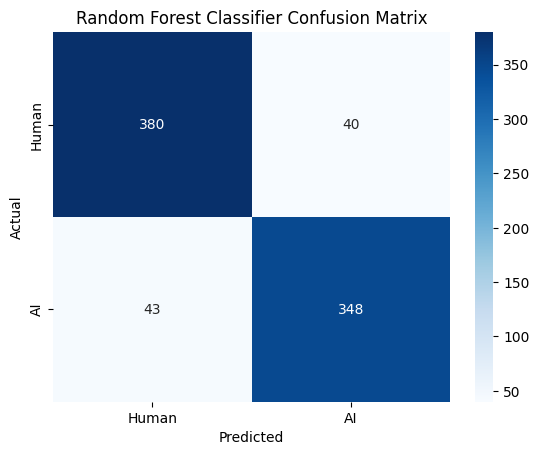

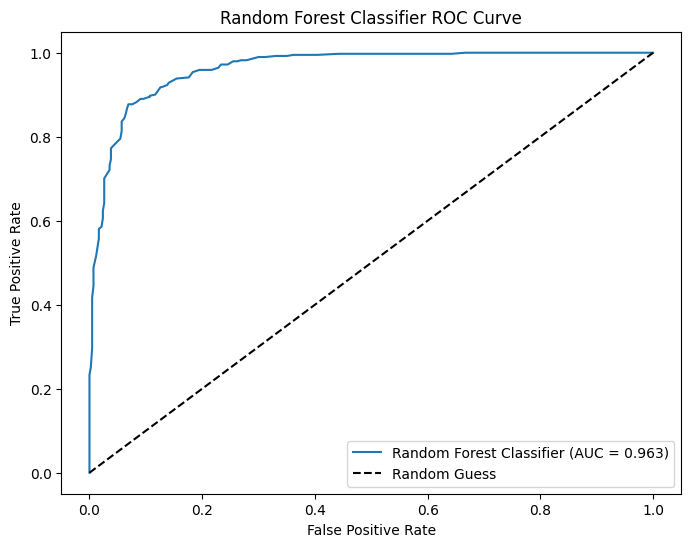

Linear Support Vector Machine EVALUATION:
	Accuracy: 0.979
	Precision: 0.968
	Recall: 0.990
	F1 Score: 0.979


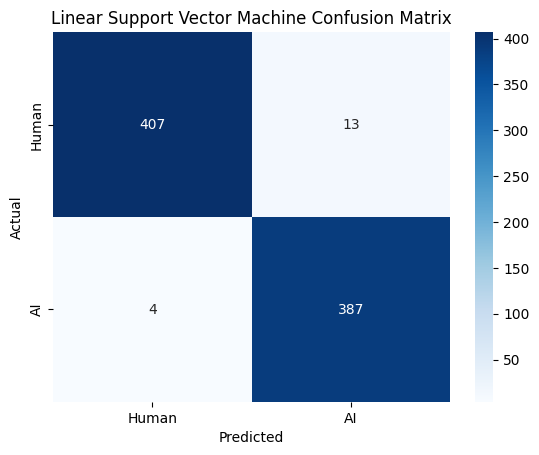

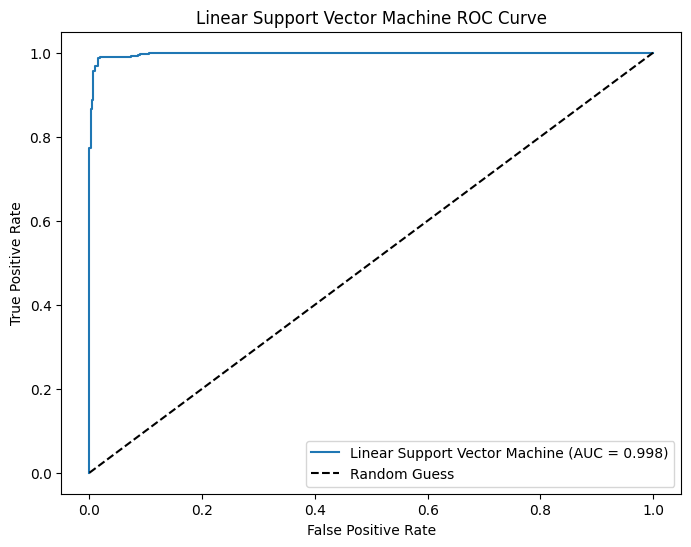

Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.977
	Precision: 0.967
	Recall: 0.985
	F1 Score: 0.976


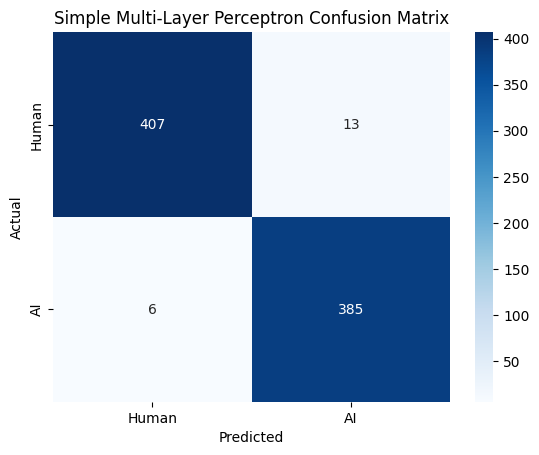

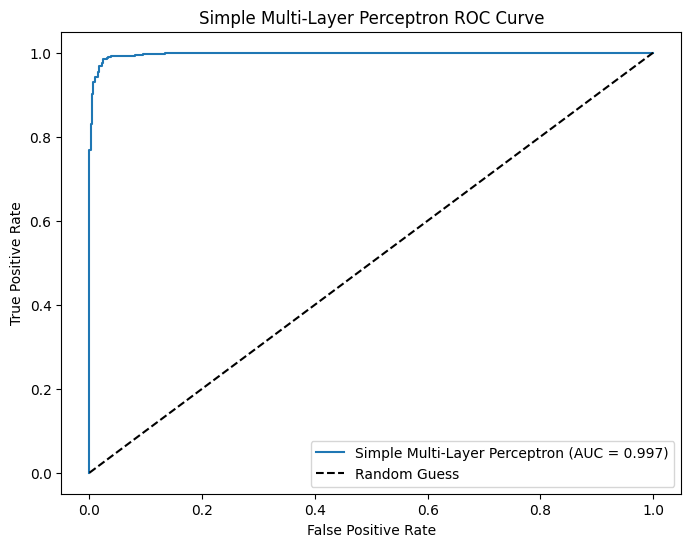

In [ ]:
# Base BERT Embeddings + Kaggle dataset
# Training and evaluating the 4 models

# Training the four regressors using BERT and Kaggle dataset
bb_log_regressor = LogisticRegression(max_iter=1000)
bb_random_forest = RandomForestClassifier(n_estimators=100, random_state=19)
bb_svm = SVC(kernel='linear', probability=True, random_state=19)
bb_mlp = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)

x_train_bb, x_test_bb, y_train_bb, y_test_bb = train_test_split(x_emb_bb, Y, test_size=0.2, random_state=19, stratify=Y)
bb_log_regressor, bb_random_forest, bb_svm, bb_mlp = train(bb_log_regressor, bb_random_forest, bb_svm, bb_mlp, x_train_bb, y_train_bb)

# Evaluating the four models
evaluate(bb_log_regressor, x_test_bb, y_test_bb, "Logistic Regression Model")
evaluate(bb_random_forest, x_test_bb, y_test_bb, "Random Forest Classifier")
evaluate(bb_svm, x_test_bb, y_test_bb, "Linear Support Vector Machine")
evaluate(bb_mlp, x_test_bb, y_test_bb, "Simple Multi-Layer Perceptron")


## BERT, Kaggle: Visualization

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


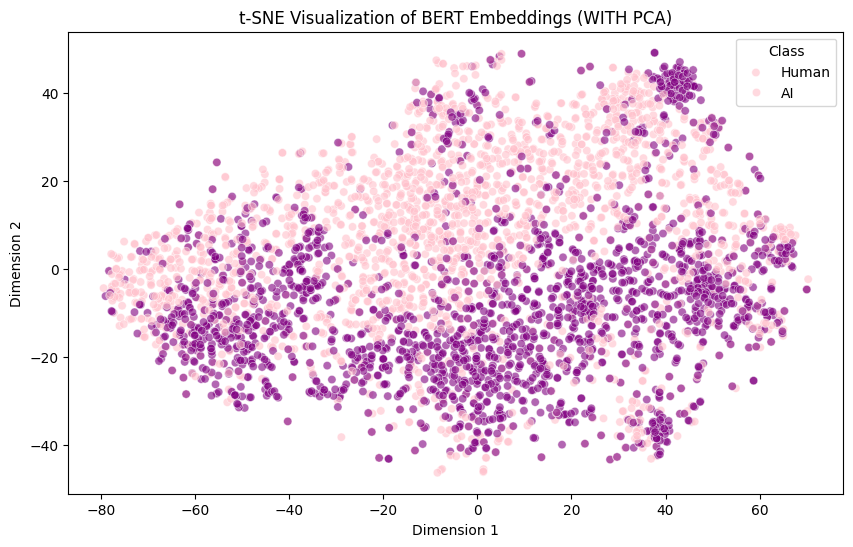

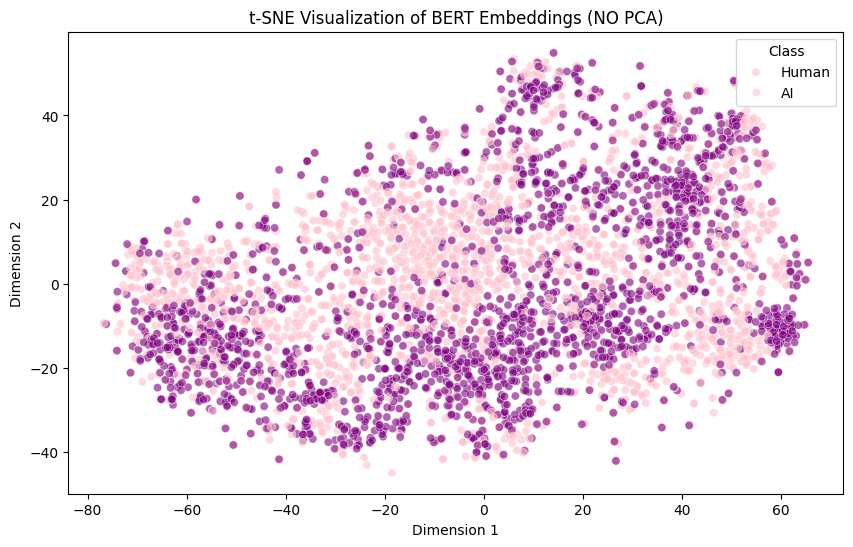

In [ ]:
# BERT, Kaggle
# First visualization function (t-SNE)
visualize_2d(x_emb_bb, dataframe, "BERT, Kaggle")

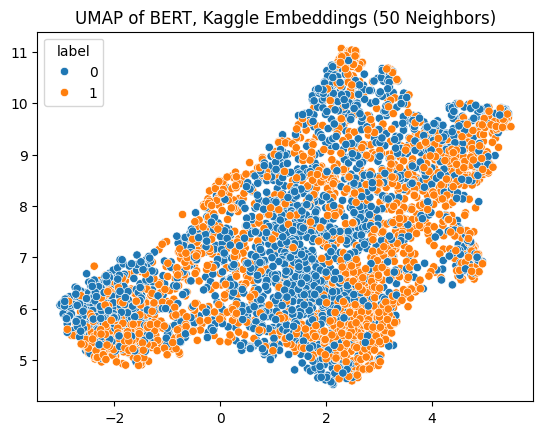

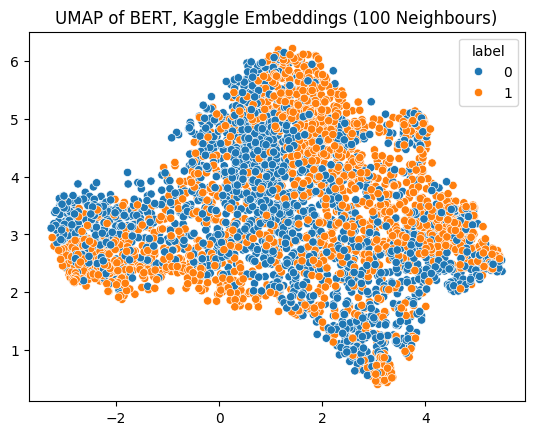

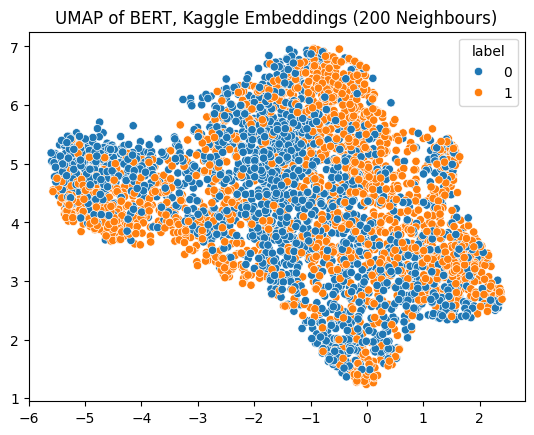

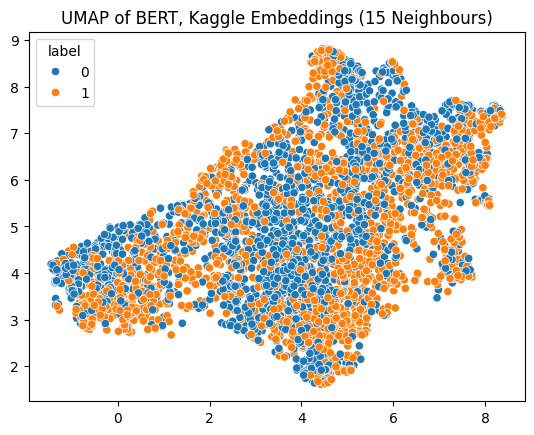

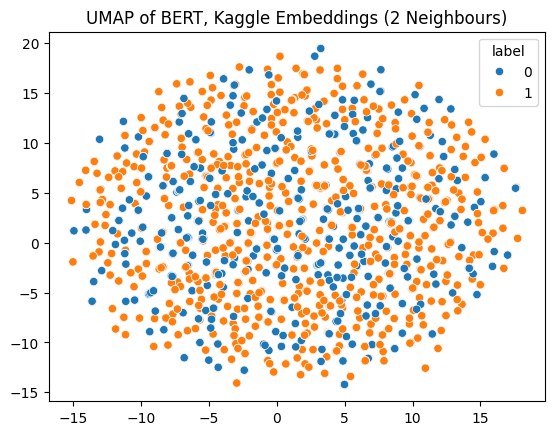

In [ ]:
# BERT, Kaggle
# UMAPs visualization
get_umaps(x_emb_bb, dataframe, "BERT, Kaggle")

In [ ]:
# BERT, Kaggle dataset
# PCA visualization (100 n_components)
print("BERT, Kaggle -- NOW SHOWING PCA for 100 COMPONENTS")
pca_visualize(x_emb_bb, dataframe, "BERT, Kaggle", 100)

Output hidden; open in https://colab.research.google.com to view.

## TF-IDF vectorization, Kaggle
- Using as a context-unaware, "baseline" embedding approach to understand how using transformers (BERT) for features/embeddings affects performance

Done training logistic regression model — Took Time (s): 0.053221940994262695
Done training random forest classifier — Took Time (s): 3.796438217163086
Done SVM classifier — Took Time (s): 4.927845478057861
Done training simple MLP — Took Time (s): 11.21973180770874
Logistic Regression Model EVALUATION:
	Accuracy: 0.988
	Precision: 0.992
	Recall: 0.982
	F1 Score: 0.987


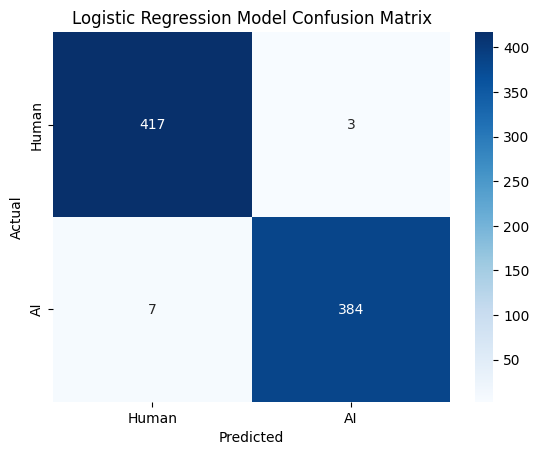

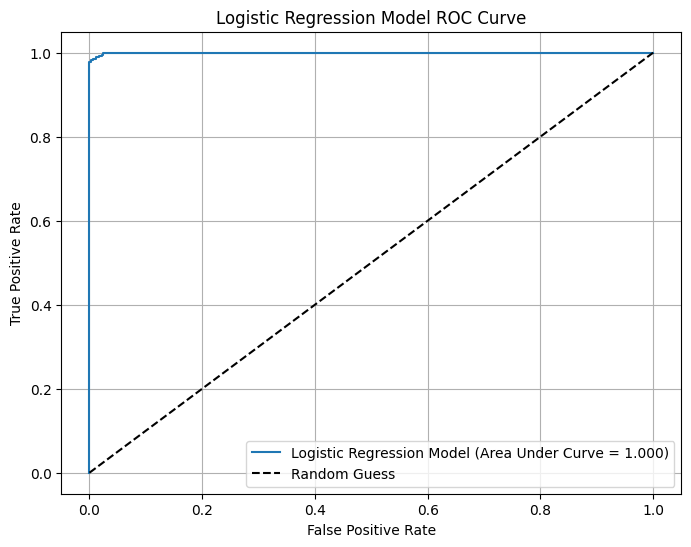

Random Forest Classifier EVALUATION:
	Accuracy: 0.995
	Precision: 0.997
	Recall: 0.992
	F1 Score: 0.995


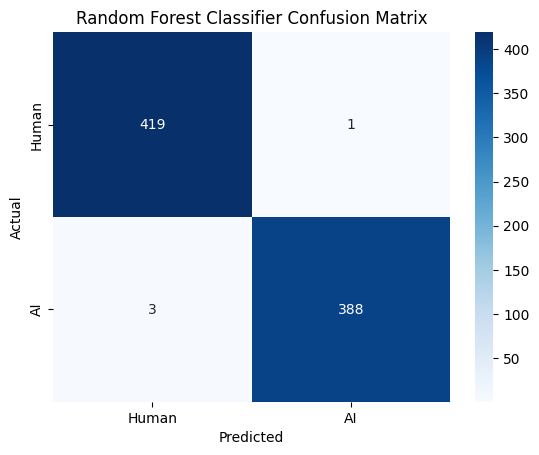

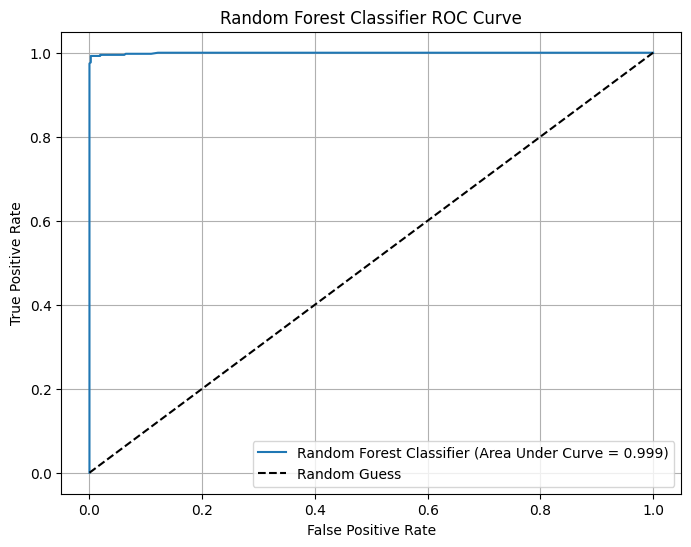

Linear Support Vector Machine EVALUATION:
	Accuracy: 0.990
	Precision: 0.997
	Recall: 0.982
	F1 Score: 0.990


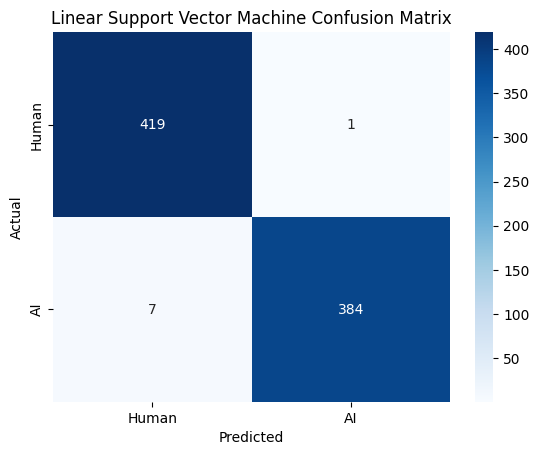

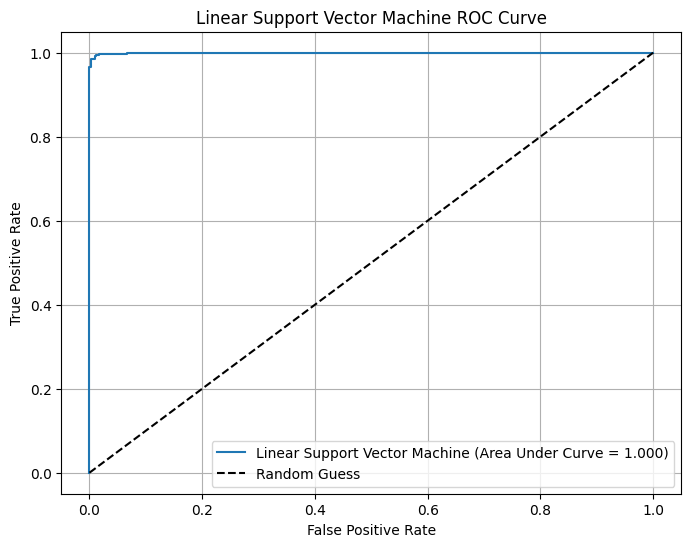

Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.988
	Precision: 0.995
	Recall: 0.980
	F1 Score: 0.987


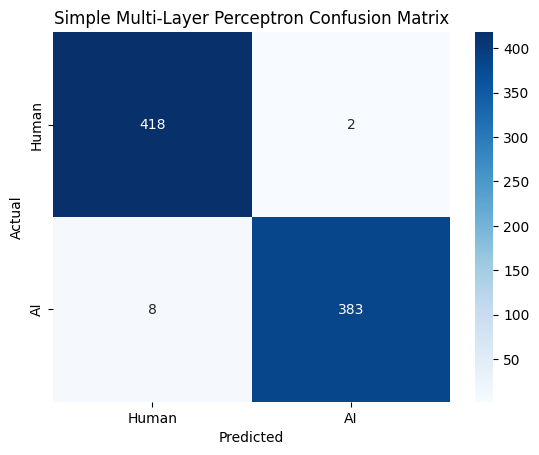

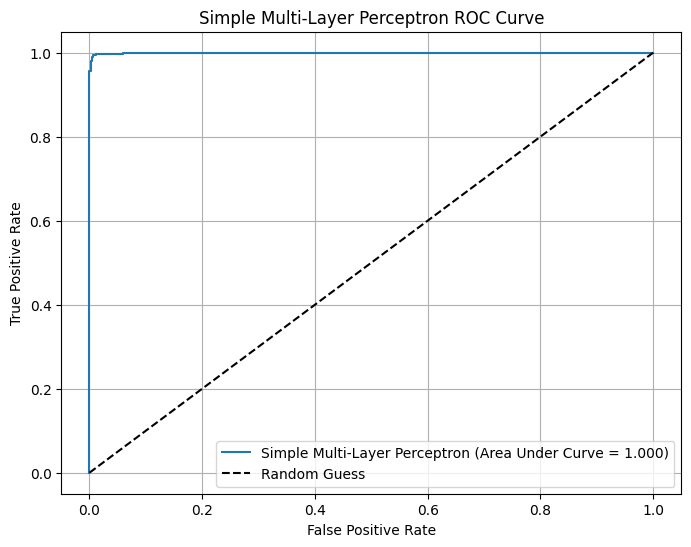

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create train-test split with raw text
X_train_raw, X_test_raw, Y_train_raw, Y_test_raw = train_test_split(X_text, Y, test_size=0.2, random_state=19, stratify=Y)
# Convert text to numeric vectors
vectorizer = TfidfVectorizer(max_features=200)
X_train_vec = vectorizer.fit_transform(X_train_raw)
X_test_vec = vectorizer.transform(X_test_raw)

# Same pipline as before
# Training the four regressors using TF-IDF vectors and Kaggle dataset
log_reg_vec = LogisticRegression(max_iter=500)
rf_vec = RandomForestClassifier(n_estimators=100, random_state=19)
svm_vec = SVC(kernel='linear', probability=True, random_state=19)
mlp_vec = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
log_reg_vec, rf_vec, svm_vec, mlp_vec = train(log_reg_vec, rf_vec, svm_vec, mlp_vec, X_train_vec, Y_train_raw)

# Evaluating the four models
evaluate(log_reg_vec, X_test_vec, Y_test_raw, "Logistic Regression Model")
evaluate(rf_vec, X_test_vec, Y_test_raw, "Random Forest Classifier")
evaluate(svm_vec, X_test_vec, Y_test_raw, "Linear Support Vector Machine")
evaluate(mlp_vec, X_test_vec, Y_test_raw, "Simple Multi-Layer Perceptron")

In [ ]:
# TF-IDF, Kaggle — ALL 3 Visualization functions in this block

# Need to vectorize all embeddings together to use dataframe in functions
X_vec = vectorizer.fit_transform(X_text)

dataframe = dataframe.rename(columns={'is_ai_generated': 'label'})
X_vec = X_vec.toarray()
visualize_2d(X_vec, dataframe, "TF-IDF")
get_umaps(X_vec, dataframe, "TF-IDF")
pca_visualize(X_vec, dataframe, "TF-IDF")

Output hidden; open in https://colab.research.google.com to view.

# HUGGING-FACE DATASET
## Initializing HF dataset
- Dataset contains 28.6K samples, but only the results on 14.3K samples were included in final report and code to maintain consistent experimental design since Kaggle dataset is only 4K. Experiment was also done with full 28.6K samples (code at the end of this notebook), but the results were the exact same for both BERT and Mini-BERT and provided no new insights that the 14.3K version didn't also provide.

In [ ]:
# Initialize the second dataset
# Dataset: "AI-and-Human-Generated-Text" by Ateeqq (from HuggingFace)

# Using pandas to read csv
splits = {'train': 'train.csv', 'test': 'test.csv'}
hf_train_db = pd.read_csv("hf://datasets/Ateeqq/AI-and-Human-Generated-Text/" + splits["train"])
hf_test_db = pd.read_csv("hf://datasets/Ateeqq/AI-and-Human-Generated-Text/" + splits["test"])

# Using half the dataset (results are same as using full dataset, this just keeps it comparable and consistent with 4K Kaggle dataset)
hf_train_db = hf_train_db.sample(frac=0.5, random_state=19)
hf_test_db = hf_test_db.sample(frac=0.5, random_state=19)

# Check the first few rows and columns
print(hf_train_db.head())
print(hf_train_db.columns)

# Check class balance just to make sure it's not under- or over-learning one class
print("Class distribution:")
print(f"Train: {hf_train_db['label'].value_counts()}")
print(f"Test: {hf_test_db['label'].value_counts()}")

# Combine title and abstract to it can take in whole text and pick up more patterns
hf_train_db['text'] = hf_train_db['title'] + ". " + hf_train_db['abstract']
hf_test_db['text'] = hf_test_db['title'] + ". " + hf_test_db['abstract']

# Remove whitespace + put text in lowercase to prevent model overfitting to
# random capslocks (since dataset somewhat small)
hf_train_db['text'] = hf_train_db['text'].str.lower().str.strip()
hf_test_db['text'] = hf_test_db['text'].str.lower().str.strip()

# Get features (text) and target (label column, 0 = human, 1 = ai)
x_hf_train = hf_train_db['text'].tolist()
y_hf_train = hf_train_db['label'].values
x_hf_test = hf_test_db['text'].tolist()
y_hf_test = hf_test_db['label'].values


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


                                                   title  \
13569  Site-Specific Conversion of Cysteine in a Prot...   
21603  Propolis from the Monte Region in Argentina: A...   
15180  Mechanical ventilation enhances Acinetobacter ...   
9161   Respiratory and Blood Stream Infections are As...   
2041   Long-Term Culture of Distal Airway Epithelial ...   

                                                abstract  label  
13569  Dehydroalanine exists natively in certain prot...      0  
21603  \n\nThis article examines the untapped potenti...      1  
15180  BACKGROUND: Patients in intensive care units (...      0  
9161   \n\nVenous Thromboembolism (VTE) is a relative...      1  
2041   As the target organ for numerous pathogens, th...      0  
Index(['title', 'abstract', 'label'], dtype='object')
Class distribution:
Train: label
1    5795
0    5670
Name: count, dtype: int64
Test: label
1    1446
0    1420
Name: count, dtype: int64


## Simple TF-IDF Vectorization: Training and Evaluating

Done training logistic regression model — Took Time (s): 0.20648431777954102
Done training random forest classifier — Took Time (s): 25.484920024871826
Done SVM classifier — Took Time (s): 85.2619514465332
Done training simple MLP — Took Time (s): 20.502203941345215
Logistic Regression Model EVALUATION:
	Accuracy: 0.990
	Precision: 0.992
	Recall: 0.988
	F1 Score: 0.990


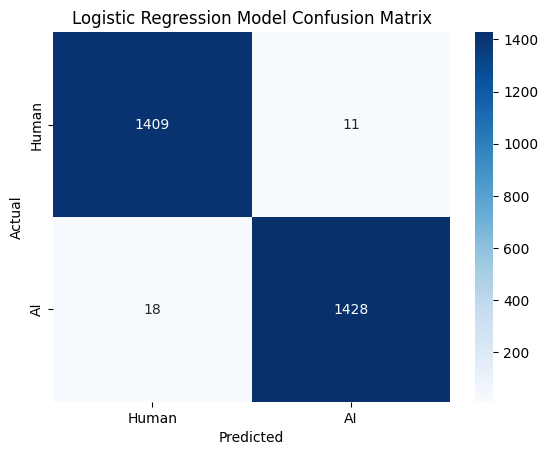

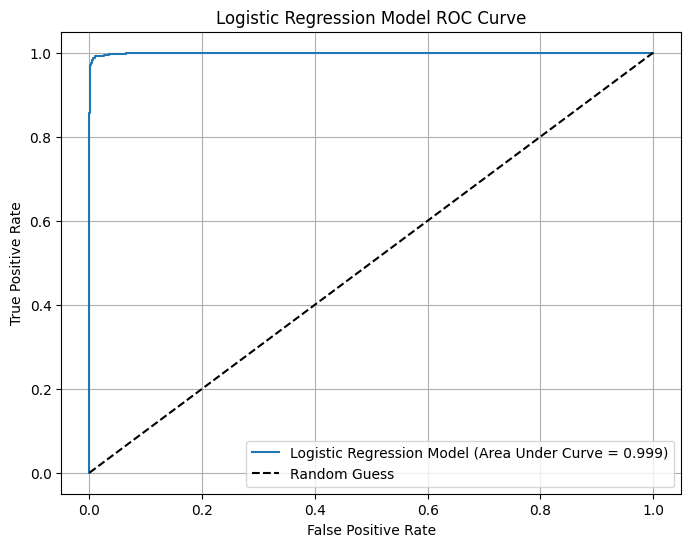

Random Forest Classifier EVALUATION:
	Accuracy: 0.987
	Precision: 0.988
	Recall: 0.987
	F1 Score: 0.987


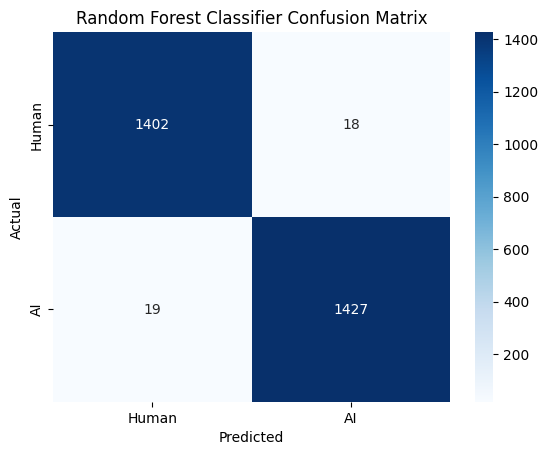

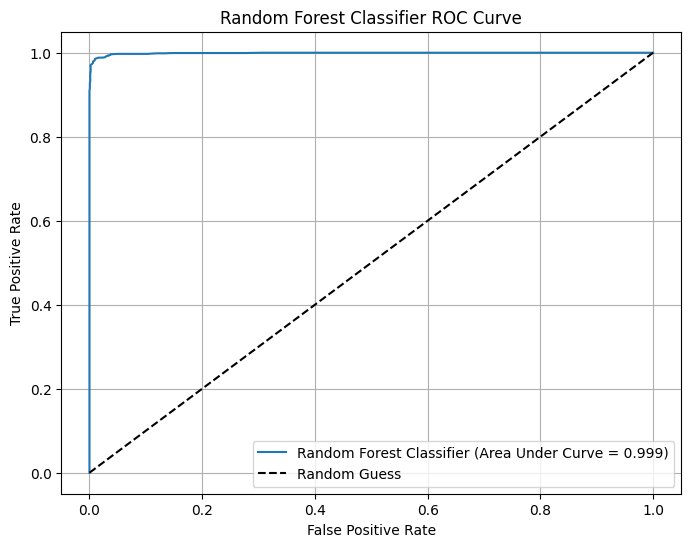

Linear Support Vector Machine EVALUATION:
	Accuracy: 0.991
	Precision: 0.994
	Recall: 0.987
	F1 Score: 0.991


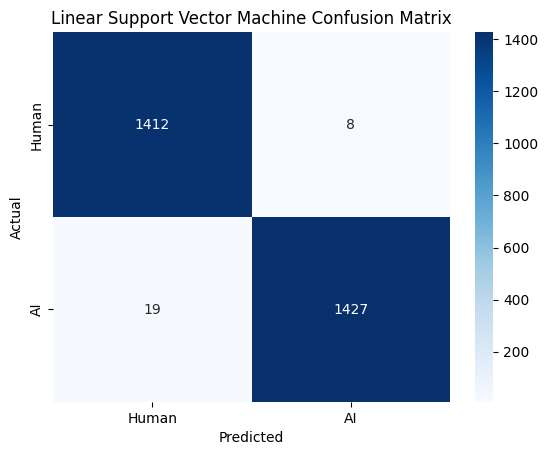

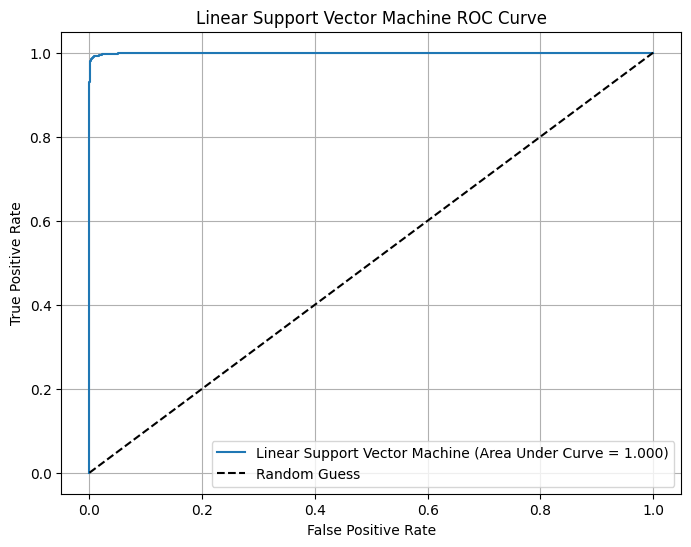

Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.988
	Precision: 0.988
	Recall: 0.988
	F1 Score: 0.988


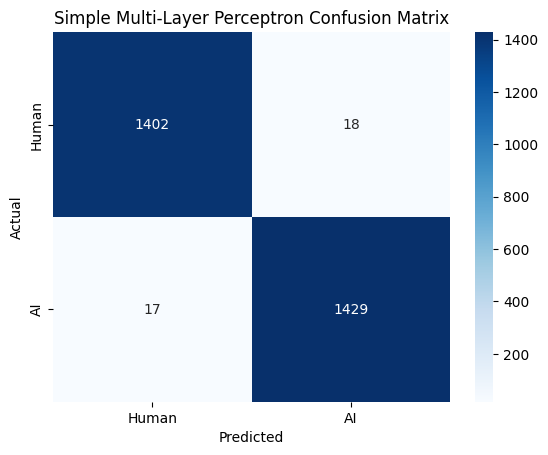

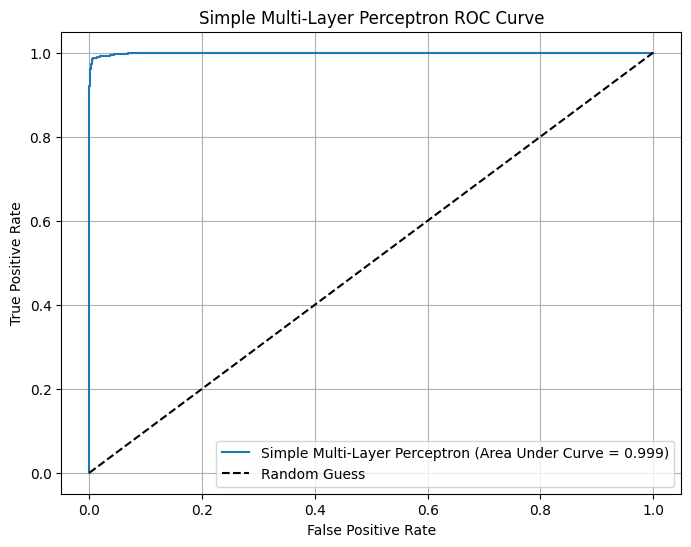

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Convert text to numeric vectors
vectorizer = TfidfVectorizer(max_features=500)
X_train_vec_hf = vectorizer.fit_transform(x_hf_train)
X_test_vec_hf = vectorizer.transform(x_hf_test)

# Same pipline as before
# Training the four regressors using TF-IDF vectors and Kaggle dataset
log_reg_vec_hf = LogisticRegression(max_iter=500)
rf_vec_hf = RandomForestClassifier(n_estimators=100, random_state=19)
svm_vec_hf = SVC(kernel='linear', probability=True, random_state=19)
mlp_vec_hf = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
log_reg_vec_hf, rf_vec_hf, svm_vec_hf, mlp_vec_hf = train(log_reg_vec_hf, rf_vec_hf, svm_vec_hf, mlp_vec_hf, X_train_vec_hf, y_hf_train)

# Evaluating the four models
evaluate(log_reg_vec_hf, X_test_vec_hf, y_hf_test, "Logistic Regression Model")
evaluate(rf_vec_hf, X_test_vec_hf, y_hf_test, "Random Forest Classifier")
evaluate(svm_vec_hf, X_test_vec_hf, y_hf_test, "Linear Support Vector Machine")
evaluate(mlp_vec_hf, X_test_vec_hf, y_hf_test, "Simple Multi-Layer Perceptron")

In [ ]:
# TF-IDF Vectorizer ALL Visualizations (14.3K samples from HuggingFace)
X_train_vec_hf = X_train_vec_hf.toarray()
visualize_2d(X_train_vec_hf, hf_train_db, "TF-IDF Vectorizer")
get_umaps(X_train_vec_hf, hf_train_db, "TF-IDF Vectorizer")
pca_visualize(X_train_vec_hf, hf_train_db, "TF-IDF Vectorizer")

Output hidden; open in https://colab.research.google.com to view.

## HuggingFace dataset: Getting Mini-BERT and BERT Embeddings of Training and Testing data

In [ ]:
# Mini-BERT, HuggingFace dataset
# Extracting HuggingFace training dataset embeddings using Mini-BERT!

# PRE-PROCESSING
# Combine title and abstract to it can take in whole text and pick up more patterns
hf_train_db['text'] = hf_train_db['title'] + ". " + hf_train_db['abstract']
hf_test_db['text'] = hf_test_db['title'] + ". " + hf_test_db['abstract']

# Remove whitespace + put text in lowercase to prevent model overfitting to
# random capslocks (since dataset somewhat small)
hf_train_db['text'] = hf_train_db['text'].str.lower().str.strip()
hf_test_db['text'] = hf_test_db['text'].str.lower().str.strip()

# Get features (text) and target (is_ai_generated column, 0 = human, 1 = ai)
X_text_hf_train = hf_train_db['text'].tolist()
Y_hf_train = hf_train_db['label'].values
X_text_hf_test = hf_test_db['text'].tolist()
Y_hf_test = hf_test_db['label'].values

# Getting embeddings on HuggingFace training dataset using Mini-BERT model
x_emb_minib_hf = model.encode(X_text_hf_train, show_progress_bar=True)


Batches:   0%|          | 0/359 [00:00<?, ?it/s]

In [ ]:
# Mini-BERT, HuggingFace
# Getting test embeddings on HuggingFace training dataset using Mini-BERT model
x_emb_minib_hf_test = model.encode(X_text_hf_test, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_minib_hf_test.shape)

Batches:   0%|          | 0/90 [00:00<?, ?it/s]

Shape of embeddings:  (2866, 384)


In [ ]:
# BERT, HuggingFace dataset
# Getting training embeddings on HuggingFace training dataset using Base BERT model
x_emb_bb_hf = base_bert_model.encode(X_text_hf_train, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_bb_hf.shape)

Batches:   0%|          | 0/359 [00:00<?, ?it/s]

Shape of embeddings:  (11465, 768)


In [ ]:
# BERT, HuggingFace dataset
# Getting test embeddings on HuggingFace training dataset using Base BERT model
x_emb_bb_hf_test = base_bert_model.encode(X_text_hf_test, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_bb_hf_test.shape)

Batches:   0%|          | 0/90 [00:00<?, ?it/s]

Shape of embeddings:  (2866, 768)


## Mini-BERT, HuggingFace dataset: Training and Evaluating

Done training logistic regression model — Took Time (s): 0.6654508113861084
Done training random forest classifier — Took Time (s): 39.83009433746338
Done SVM classifier — Took Time (s): 145.82666492462158
Done training simple MLP — Took Time (s): 15.640413522720337
Mini-BERT, HF, Logistic Regression Model EVALUATION:
	Accuracy: 0.858
	Precision: 0.857
	Recall: 0.863
	F1 Score: 0.860


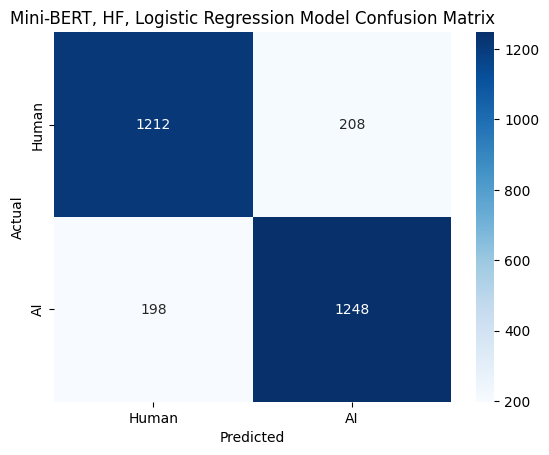

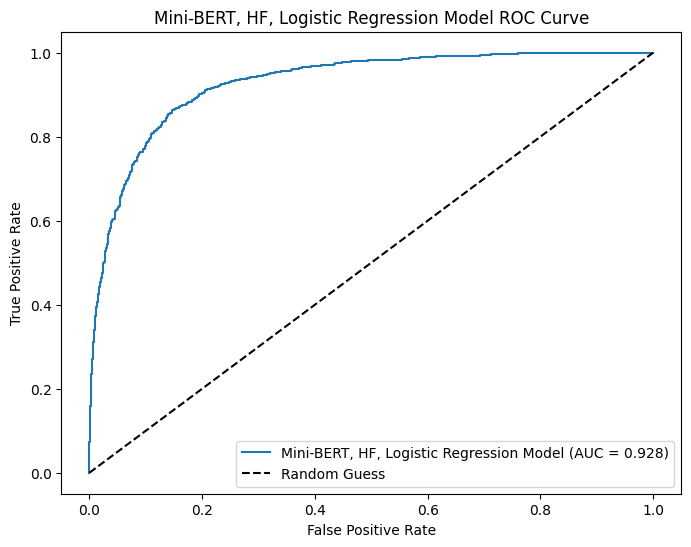

Mini-BERT, HF, Random Forest Classifier EVALUATION:
	Accuracy: 0.755
	Precision: 0.764
	Recall: 0.745
	F1 Score: 0.754


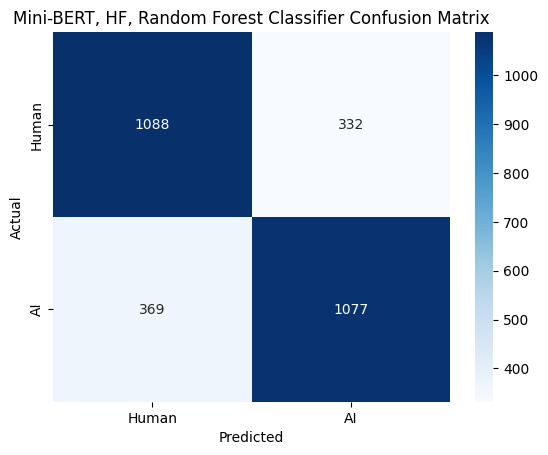

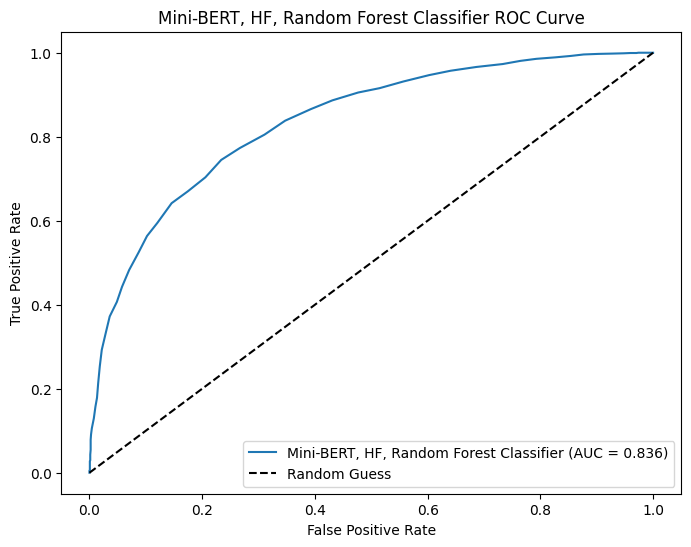

Mini-BERT, HF, Linear Support Vector Machine EVALUATION:
	Accuracy: 0.872
	Precision: 0.870
	Recall: 0.878
	F1 Score: 0.874


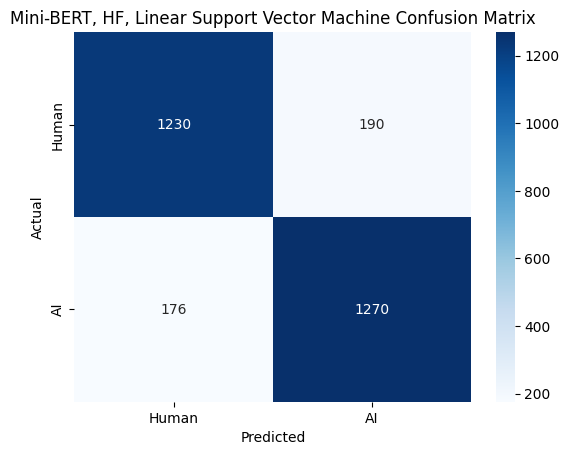

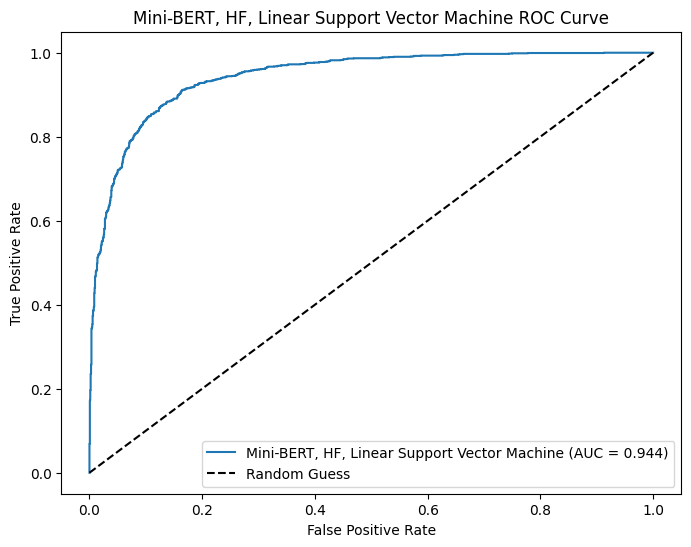

Mini-BERT, HF, Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.886
	Precision: 0.887
	Recall: 0.887
	F1 Score: 0.887


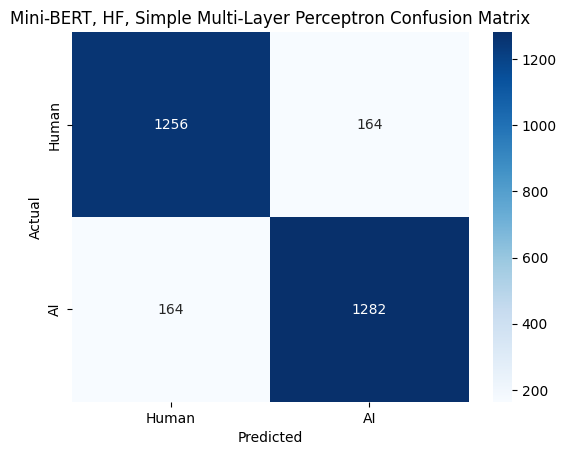

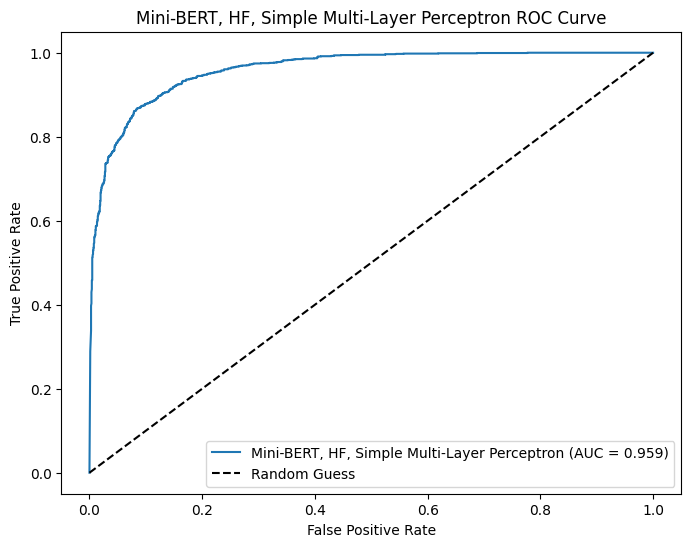

In [ ]:
# Mini-BERT model, HuggingFace dataset

# Training the four regressors using Mini-BERT and HF dataset
log_regressor_hf = LogisticRegression(max_iter=1000)
random_forest_hf = RandomForestClassifier(n_estimators=100, random_state=19)
svm_hf = SVC(kernel='linear', probability=True, random_state=19)
mlp_hf = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
log_regressor_hf, random_forest_hf, svm_hf, mlp_hf = train(log_regressor_hf, random_forest_hf, svm_hf, mlp_hf, x_emb_minib_hf, Y_hf_train)

# Evaluating the four models
evaluate(log_regressor_hf, x_emb_minib_hf_test, Y_hf_test, "Mini-BERT, HF, Logistic Regression Model")
evaluate(random_forest_hf, x_emb_minib_hf_test, Y_hf_test, "Mini-BERT, HF, Random Forest Classifier")
evaluate(svm_hf, x_emb_minib_hf_test, Y_hf_test, "Mini-BERT, HF, Linear Support Vector Machine")
evaluate(mlp_hf, x_emb_minib_hf_test, Y_hf_test, "Mini-BERT, HF, Simple Multi-Layer Perceptron")

## Mini-BERT, HuggingFace dataset: Visualization

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


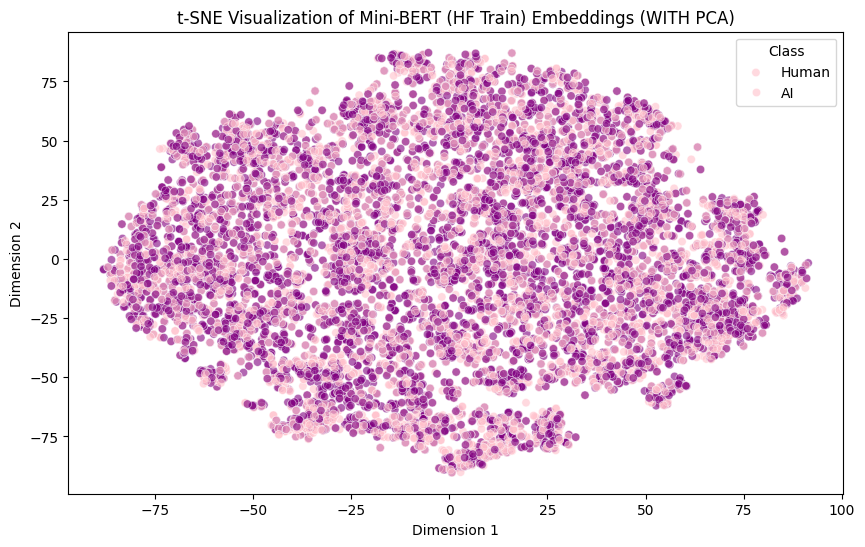

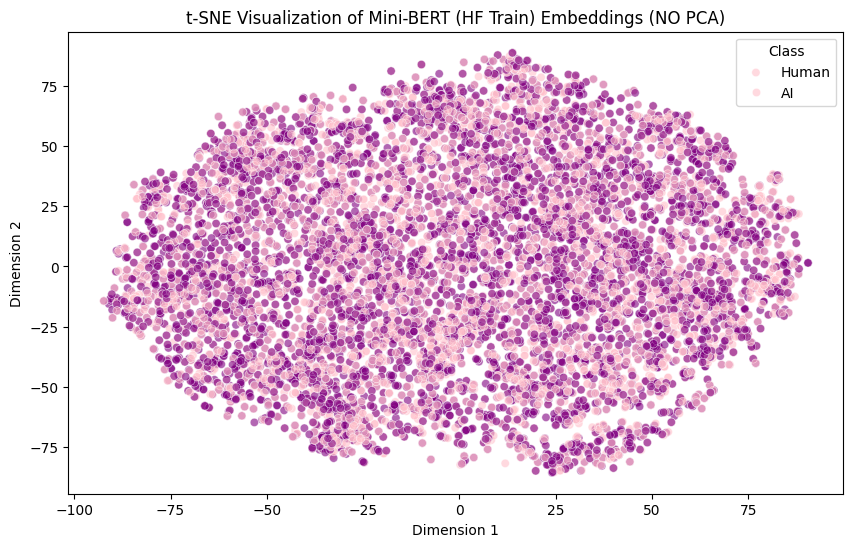


NOW ON TEST DATA EMBEDDINGS:



/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


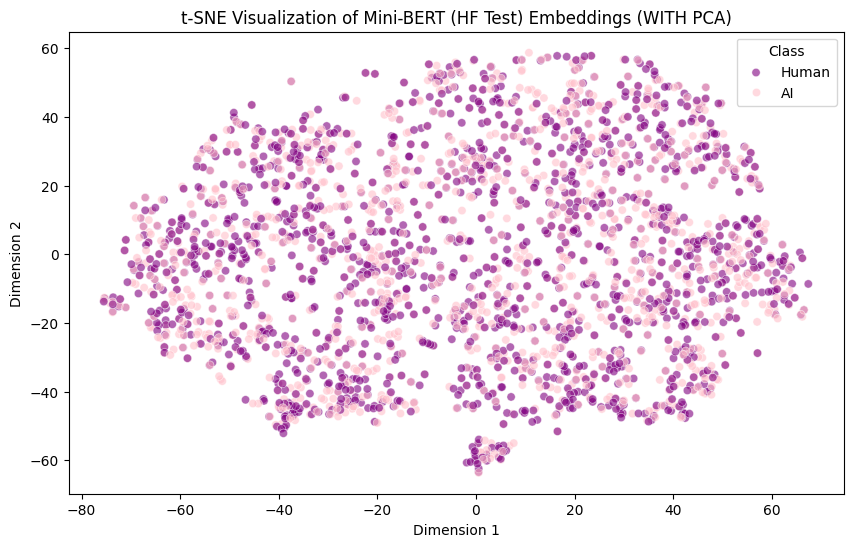

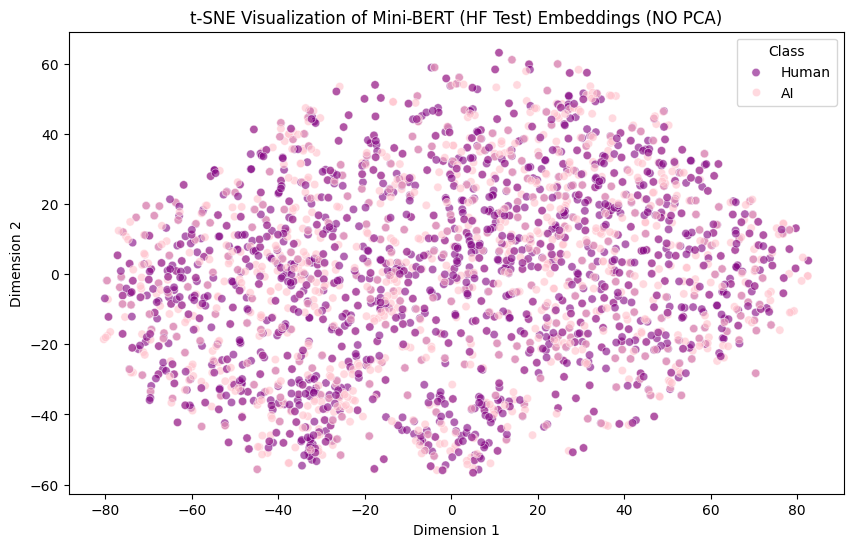

In [ ]:
# Mini-BERT, HuggingFace
# Initial Visualization function
# First on training embeddings, then on testing (just to see which one shows info more clearly)
visualize_2d(x_emb_minib_hf, hf_train_db, "Mini-BERT (HF Train)")
print("\nNOW ON TEST DATA EMBEDDINGS:\n")
visualize_2d(x_emb_minib_hf_test, hf_test_db, "Mini-BERT (HF Test)")


In [ ]:
# Mini-BERT, HuggingFace
# UMAPs
get_umaps(x_emb_minib_hf, hf_train_db, "Mini-BERT (HF Train)")
print("\nNOW ON TEST DATA EMBEDDINGS:\n")
get_umaps(x_emb_minib_hf_test, hf_test_db, "Mini-BERT (HF Test)")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Mini-BERT, HuggingFace
# PCA visualizations
pca_visualize(x_emb_minib_hf, hf_train_db, "Mini-BERT (HF Train)")
print("\nNOW ON TEST DATA EMBEDDINGS:\n")
pca_visualize(x_emb_minib_hf_test, hf_test_db, "Mini-BERT (HF Test)")

Output hidden; open in https://colab.research.google.com to view.

## BERT, HuggingFace: Training and Evaluating

Done training logistic regression model — Took Time (s): 6.782653093338013
Done training random forest classifier — Took Time (s): 56.68316102027893
Done SVM classifier — Took Time (s): 209.5367875099182
Done training simple MLP — Took Time (s): 24.860578536987305
Base BERT, HF, Logistic Regression Model EVALUATION:
	Accuracy: 0.938
	Precision: 0.941
	Recall: 0.935
	F1 Score: 0.938


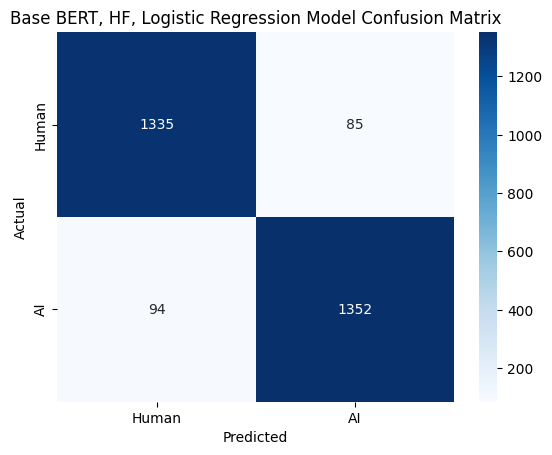

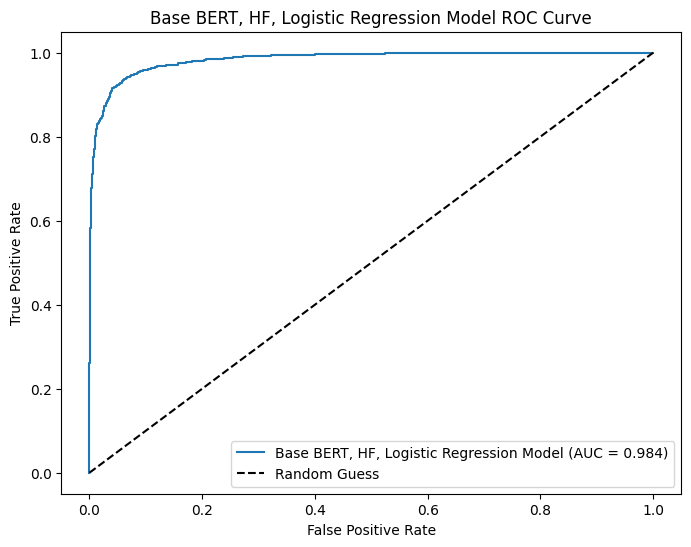

Base BERT, HF, Random Forest Classifier EVALUATION:
	Accuracy: 0.762
	Precision: 0.780
	Recall: 0.736
	F1 Score: 0.757


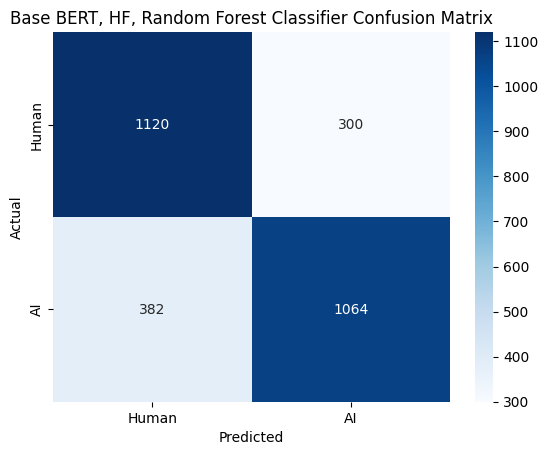

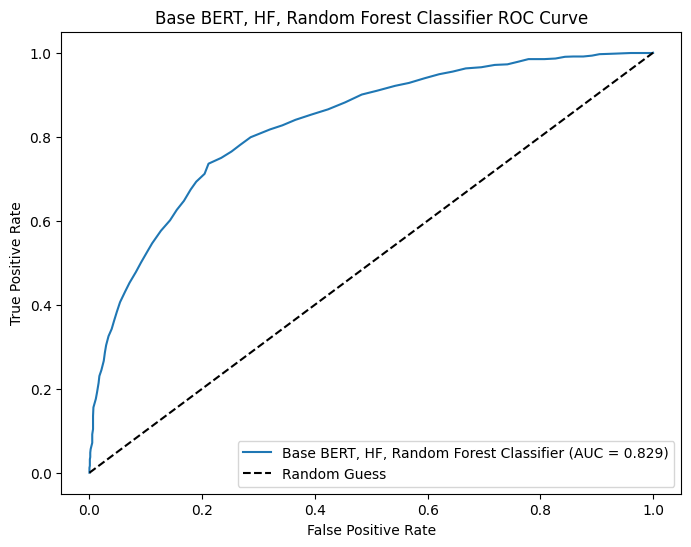

Base BERT, HF, Linear Support Vector Machine EVALUATION:
	Accuracy: 0.933
	Precision: 0.936
	Recall: 0.931
	F1 Score: 0.933


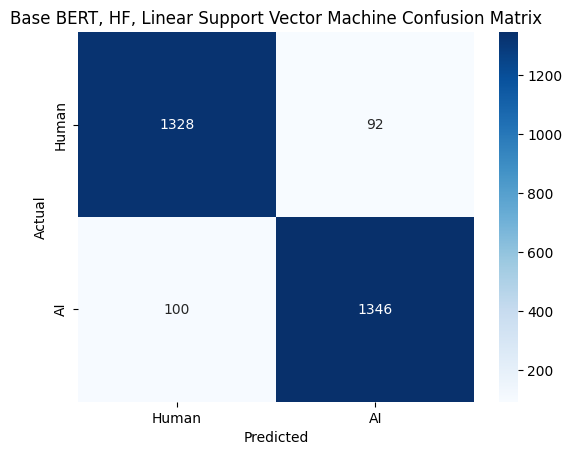

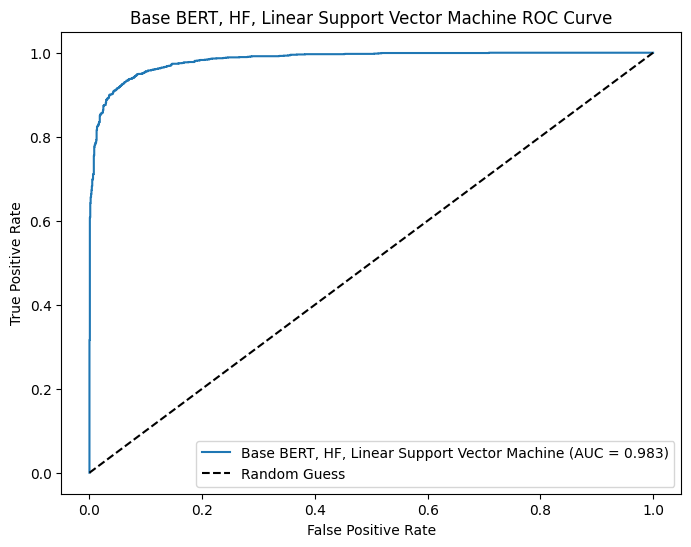

Base BERT, HF, Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.913
	Precision: 0.915
	Recall: 0.912
	F1 Score: 0.913


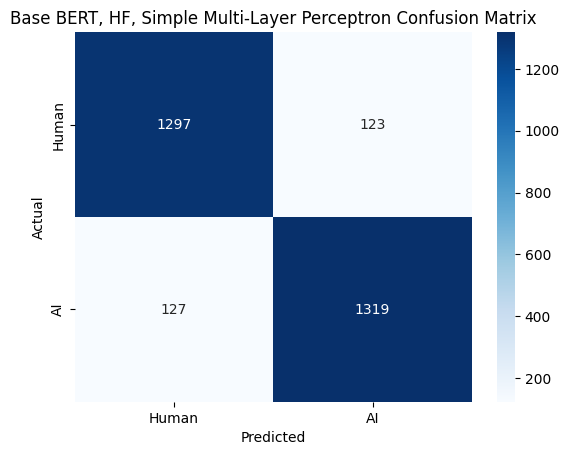

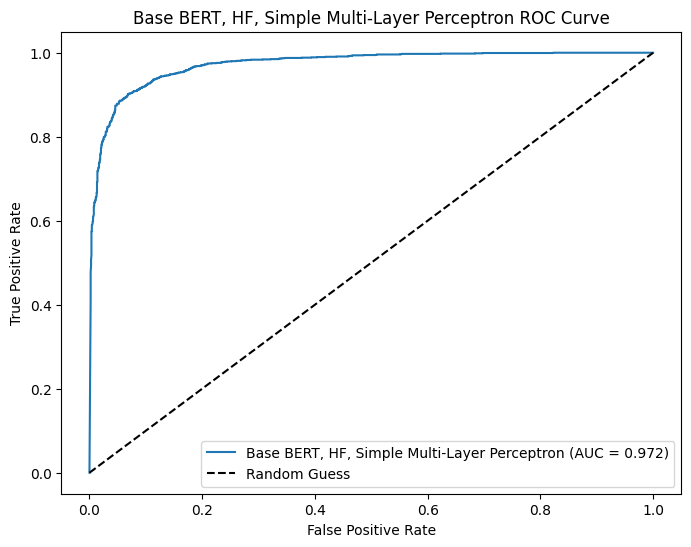

In [ ]:
# BERT, HuggingFace

# Training the four regressors using BERT and HF dataset
log_regressor_hf_bb = LogisticRegression(max_iter=1000)
random_forest_hf_bb = RandomForestClassifier(n_estimators=100, random_state=19)
svm_hf_bb = SVC(kernel='linear', probability=True, random_state=19)
mlp_hf_bb = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
log_regressor_hf_bb, random_forest_hf_bb, svm_hf_bb, mlp_hf_bb = train(log_regressor_hf, random_forest_hf, svm_hf, mlp_hf, x_emb_bb_hf, Y_hf_train)

# Evaluating the four models
evaluate(log_regressor_hf_bb, x_emb_bb_hf_test, Y_hf_test, "Base BERT, HF, Logistic Regression Model")
evaluate(random_forest_hf_bb, x_emb_bb_hf_test, Y_hf_test, "Base BERT, HF, Random Forest Classifier")
evaluate(svm_hf_bb, x_emb_bb_hf_test, Y_hf_test, "Base BERT, HF, Linear Support Vector Machine")
evaluate(mlp_hf_bb, x_emb_bb_hf_test, Y_hf_test, "Base BERT, HF, Simple Multi-Layer Perceptron")

## BERT, HuggingFace dataset: Visualizations

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


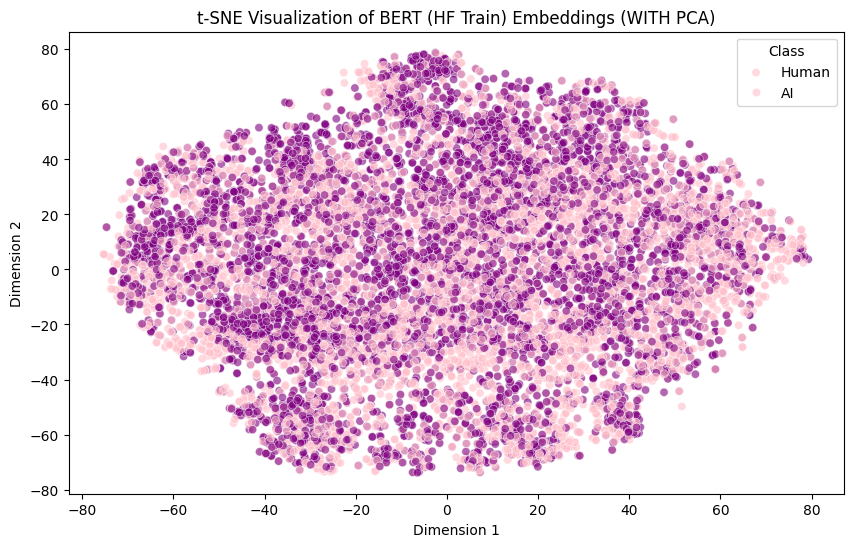

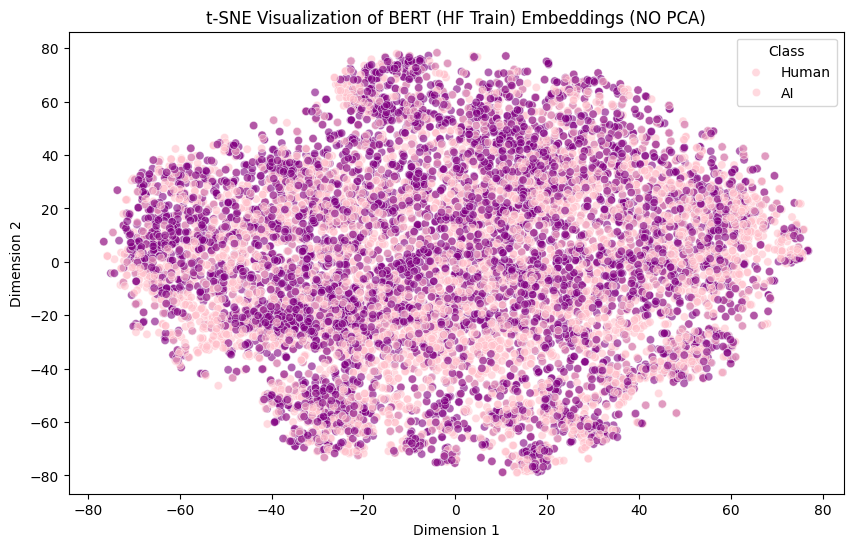


NOW ON TEST DATA EMBEDDINGS:



/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


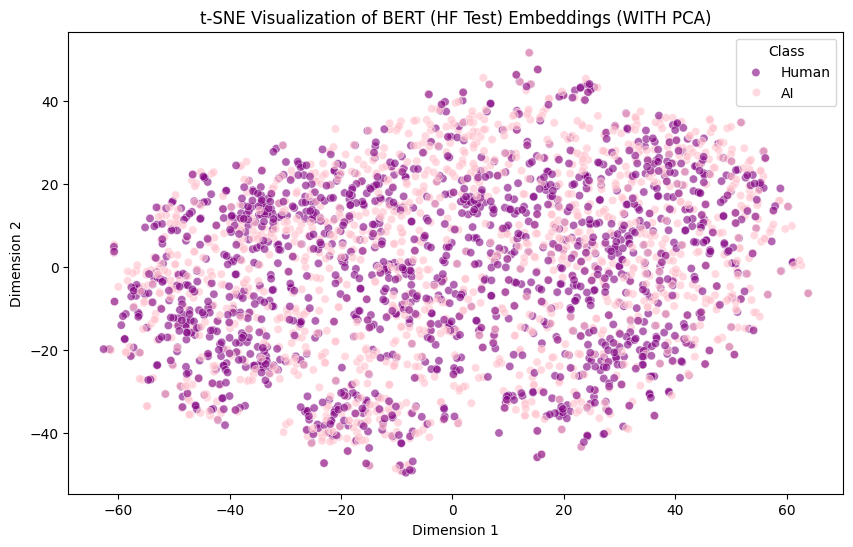

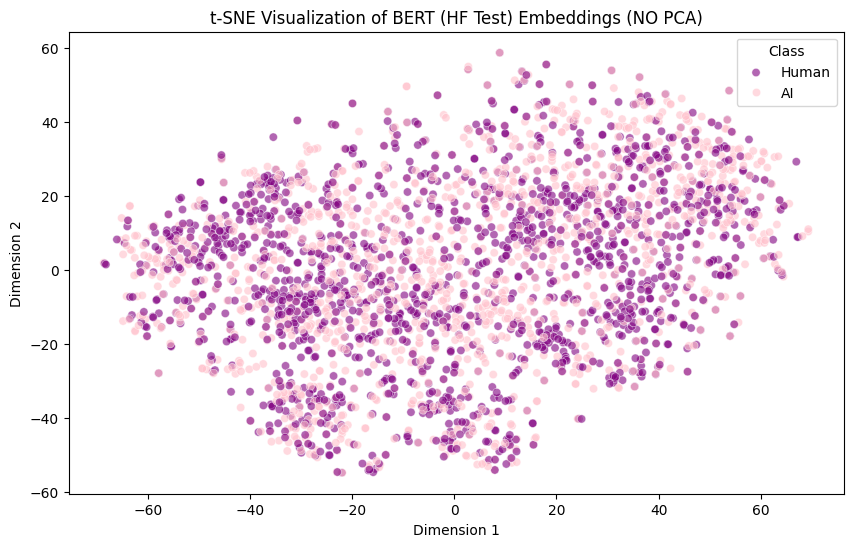

In [ ]:
# BERT, HuggingFace
# First visualization function (t-SNEs)
visualize_2d(x_emb_bb_hf, hf_train_db, "BERT (HF Train)")
print("\nNOW ON TEST DATA EMBEDDINGS:\n")
visualize_2d(x_emb_bb_hf_test, hf_test_db, "BERT (HF Test)")

In [ ]:
# BERT, HuggingFace
# UMAPS visualization function
get_umaps(x_emb_bb_hf, hf_train_db, "BERT (HF Train)")
print("\nNOW ON TEST DATA EMBEDDINGS:\n")
get_umaps(x_emb_bb_hf_test, hf_test_db, "BERT (HF Test)")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# BERT, HuggingFace
# PCA visualization function
pca_visualize(x_emb_bb_hf, hf_train_db, "BERT (HF Train)")
print("\nNOW ON TEST DATA EMBEDDINGS:\n")
pca_visualize(x_emb_bb_hf_test, hf_test_db, "BERT (HF Test)")

Output hidden; open in https://colab.research.google.com to view.

# NOT INCLUDED IN REPORT DUE TO PAGE LIMITS AND REDUNDANCY: Using FULL Hugging Face dataset (28.6K samples)
- RESULTS SUMMARY: Same behaviours as using 14.3K samples, so only include the 14.3K samples in report since it shows differences more clearly.
- These results just help show that TF-IDF's impressive performance is not a result of overfitting

## TF-IDF, Full HuggingFace: Training, Evaluating, and Visualizations

Done training logistic regression model — Took Time (s): 0.2383265495300293
Done training random forest classifier — Took Time (s): 42.219322204589844
Done SVM classifier — Took Time (s): 199.953129529953
Done training simple MLP — Took Time (s): 28.795511722564697
Logistic Regression Model EVALUATION:
	Accuracy: 0.989
	Precision: 0.990
	Recall: 0.987
	F1 Score: 0.989


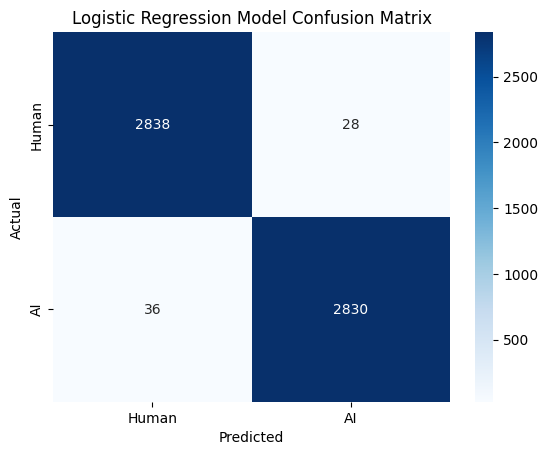

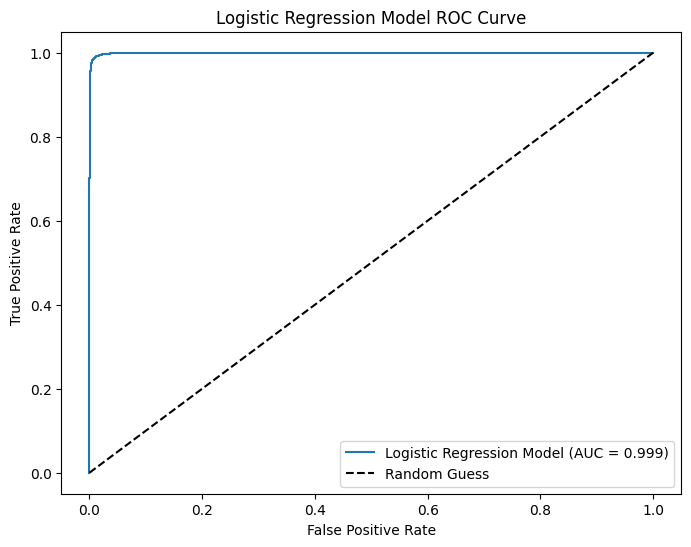

Random Forest Classifier EVALUATION:
	Accuracy: 0.987
	Precision: 0.986
	Recall: 0.988
	F1 Score: 0.987


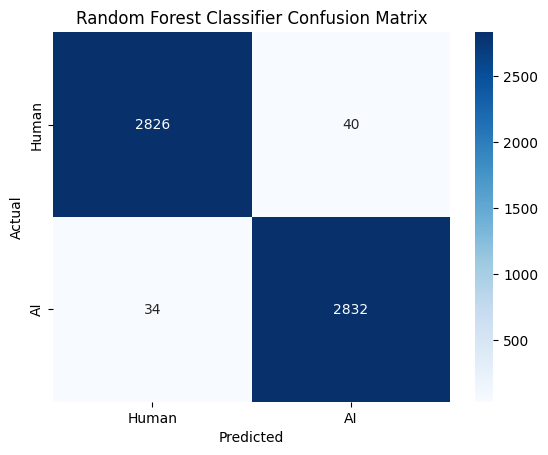

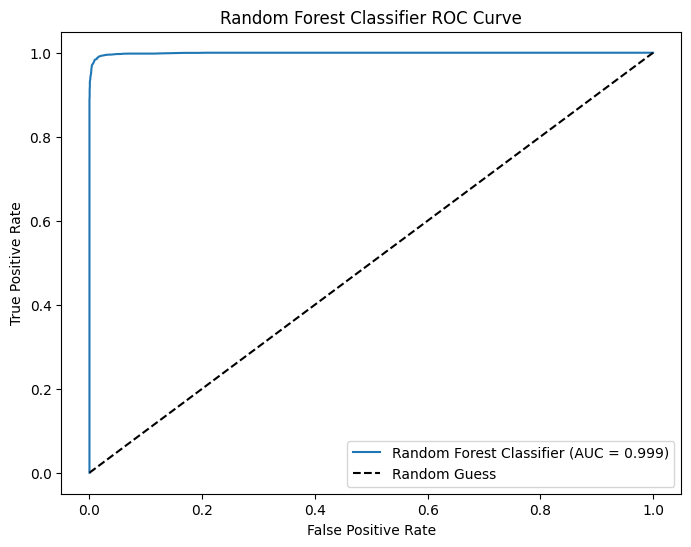

Linear Support Vector Machine EVALUATION:
	Accuracy: 0.991
	Precision: 0.992
	Recall: 0.990
	F1 Score: 0.991


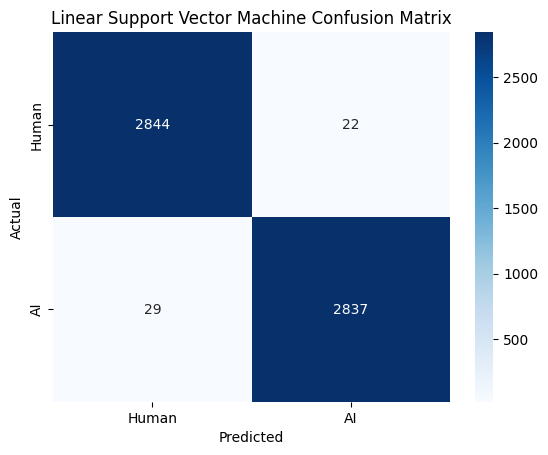

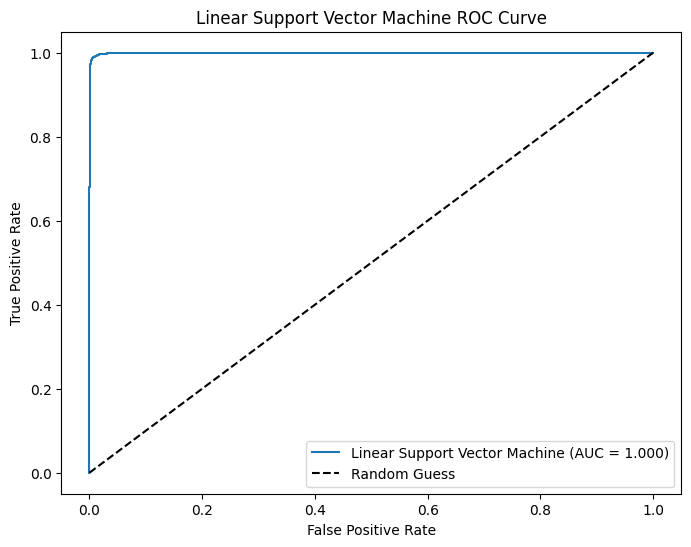

Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.989
	Precision: 0.990
	Recall: 0.988
	F1 Score: 0.989


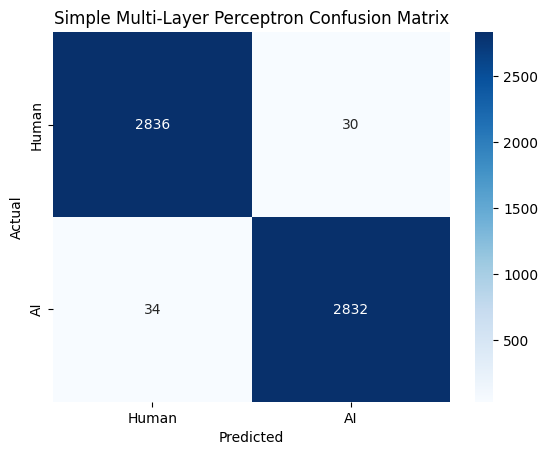

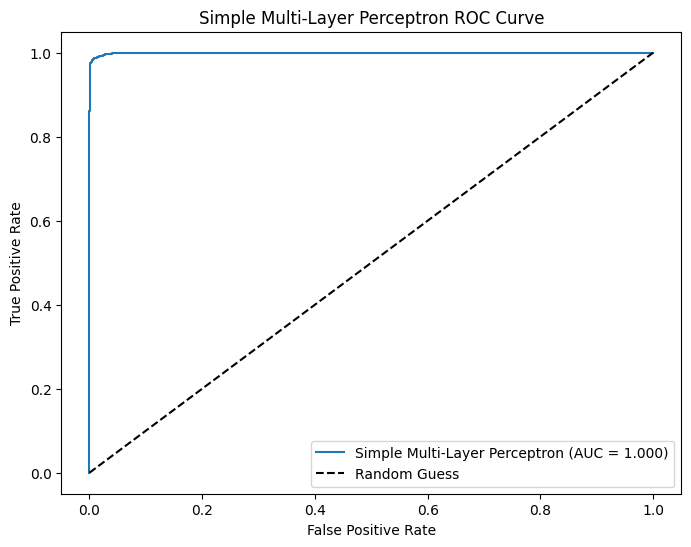

In [ ]:
# Trying the FULL Hugging Face dataset to see if maybe Vectorizer is just memorizing cause dataset is small
hf_train_db_big = pd.read_csv("hf://datasets/Ateeqq/AI-and-Human-Generated-Text/" + splits["train"])
hf_test_db_big = pd.read_csv("hf://datasets/Ateeqq/AI-and-Human-Generated-Text/" + splits["test"])

# Combine title and abstract to it can take in whole text and pick up more patterns
hf_train_db_big['text'] = hf_train_db_big['title'] + ". " + hf_train_db_big['abstract']
hf_test_db_big['text'] = hf_test_db_big['title'] + ". " + hf_test_db_big['abstract']

# Remove whitespace + put text in lowercase to prevent model overfitting to
# random capslocks (since dataset somewhat small)
hf_train_db_big['text'] = hf_train_db_big['text'].str.lower().str.strip()
hf_test_db_big['text'] = hf_test_db_big['text'].str.lower().str.strip()

# Get features (text) and target (label column, 0 = human, 1 = ai)
x_hf_train_big = hf_train_db_big['text'].tolist()
y_hf_train_big = hf_train_db_big['label'].values
x_hf_test_big = hf_test_db_big['text'].tolist()
y_hf_test_big = hf_test_db_big['label'].values


# Training and evaluating
# Convert text to numeric vectors
vectorizer = TfidfVectorizer(max_features=500)
X_train_vec_hf = vectorizer.fit_transform(x_hf_train_big)
X_test_vec_hf = vectorizer.transform(x_hf_test_big)

# Same pipeline as before
# Training the four regressors using TF-IDF vectors and Kaggle dataset
log_reg_vec_hf = LogisticRegression(max_iter=500)
rf_vec_hf = RandomForestClassifier(n_estimators=100, random_state=19)
svm_vec_hf = SVC(kernel='linear', probability=True, random_state=19)
mlp_vec_hf = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
log_reg_vec_hf, rf_vec_hf, svm_vec_hf, mlp_vec_hf = train(log_reg_vec_hf, rf_vec_hf, svm_vec_hf, mlp_vec_hf, X_train_vec_hf, y_hf_train_big)

# Evaluating the four models
evaluate(log_reg_vec_hf, X_test_vec_hf, y_hf_test_big, "Logistic Regression Model")
evaluate(rf_vec_hf, X_test_vec_hf, y_hf_test_big, "Random Forest Classifier")
evaluate(svm_vec_hf, X_test_vec_hf, y_hf_test_big, "Linear Support Vector Machine")
evaluate(mlp_vec_hf, X_test_vec_hf, y_hf_test_big, "Simple Multi-Layer Perceptron")


In [ ]:
# TF-IDF on full, 28K HuggingFace dataset — 28K USED ONLY FOR TF-IDF JUST TO CHECK FOR OVERFITTING DUE TO DATASET SIZE
# Visualizing
X_test_vec_hf = X_test_vec_hf.toarray()
visualize_2d(X_test_vec_hf, hf_test_db_big, "TF-IDF Vectorizer")
pca_visualize(X_test_vec_hf, hf_test_db_big, "TF-IDF Vectorizer")

Output hidden; open in https://colab.research.google.com to view.

## Mini-BERT, Full HF dataset: Training, Evaluating, and Visualizations

In [ ]:
# Mini-BERT, Full HF dataset
# Getting embeddings

# Getting training embeddings
x_emb_minib_hf_train_big = model.encode(x_hf_train_big, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_minib_hf_train_big.shape)

# Getting testing embeddings
x_emb_minib_hf_test_big = model.encode(x_hf_test_big, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_minib_hf_test_big.shape)

Batches:   0%|          | 0/717 [00:00<?, ?it/s]

Shape of embeddings:  (22930, 384)


Batches:   0%|          | 0/180 [00:00<?, ?it/s]

Shape of embeddings:  (5732, 384)


Done training logistic regression model — Took Time (s): 1.2657814025878906
Done training random forest classifier — Took Time (s): 88.67606210708618
Done SVM classifier — Took Time (s): 543.2302367687225
Done training simple MLP — Took Time (s): 47.49293327331543
Mini-BERT, HF, Logistic Regression Model EVALUATION:
	Accuracy: 0.864
	Precision: 0.866
	Recall: 0.861
	F1 Score: 0.863


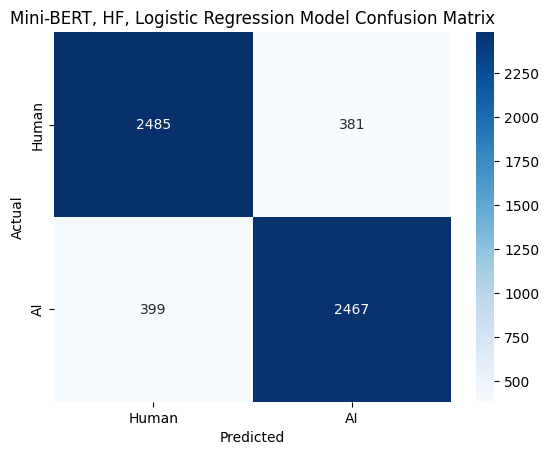

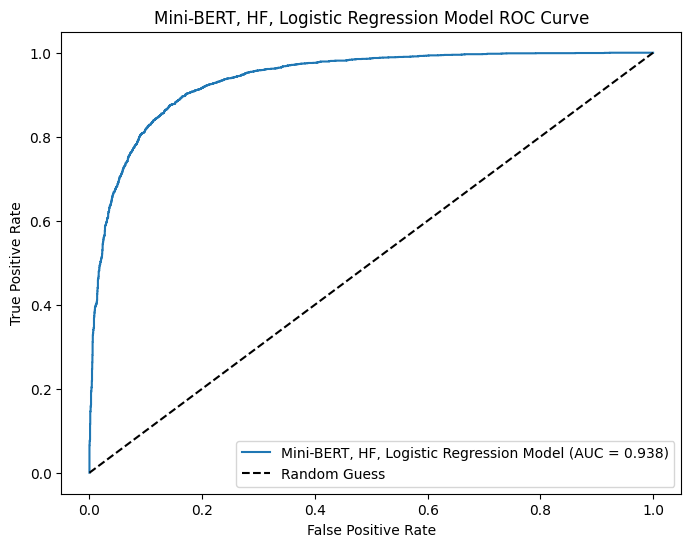

Mini-BERT, HF, Random Forest Classifier EVALUATION:
	Accuracy: 0.763
	Precision: 0.776
	Recall: 0.738
	F1 Score: 0.757


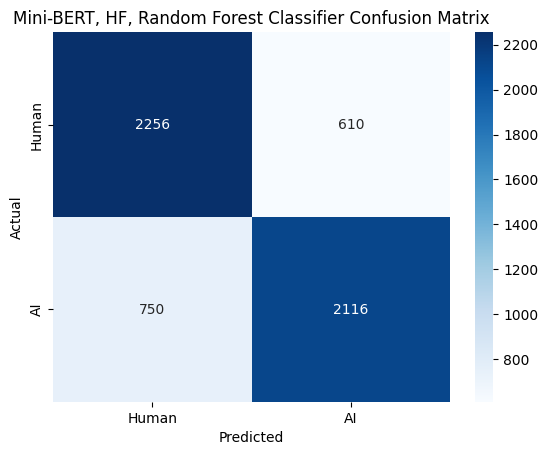

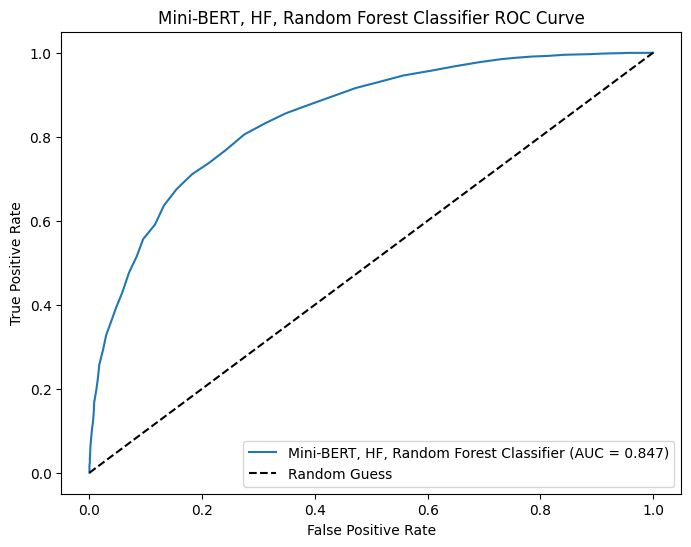

Mini-BERT, HF, Linear Support Vector Machine EVALUATION:
	Accuracy: 0.880
	Precision: 0.882
	Recall: 0.879
	F1 Score: 0.880


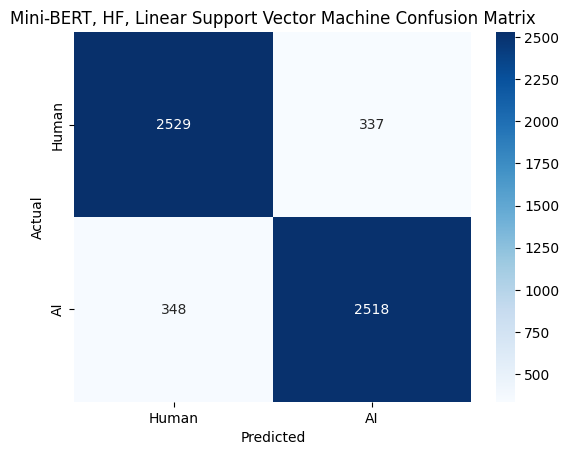

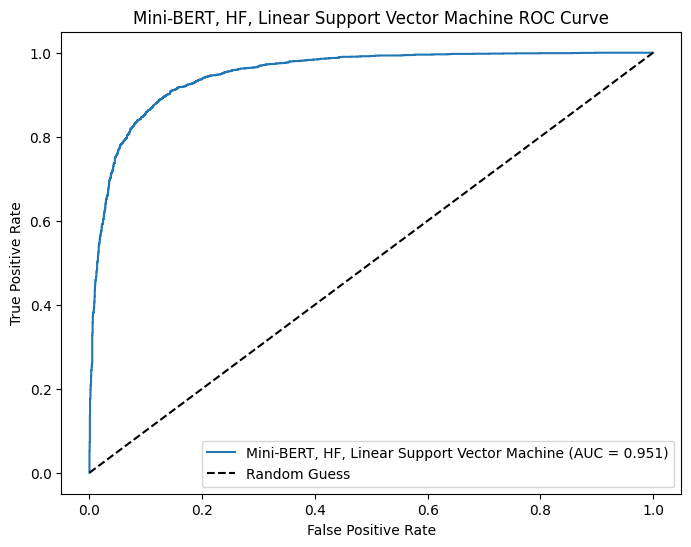

Mini-BERT, HF, Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.902
	Precision: 0.906
	Recall: 0.898
	F1 Score: 0.902


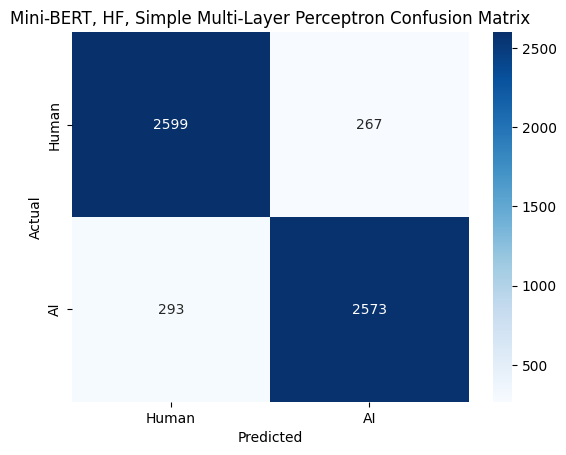

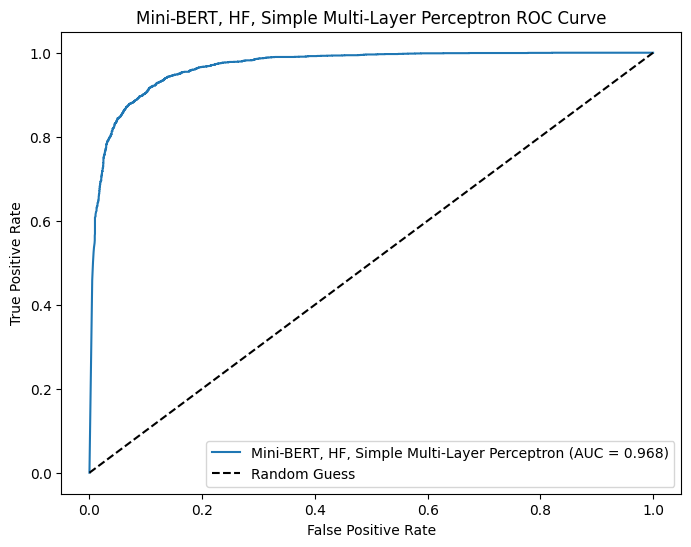

In [ ]:
# Mini-BERT model, FULL HuggingFace dataset

# Training the four regressors using Mini-BERT and HF dataset
log_regressor_hf_big = LogisticRegression(max_iter=1000)
random_forest_hf_big = RandomForestClassifier(n_estimators=100, random_state=19)
svm_hf_big = SVC(kernel='linear', probability=True, random_state=19)
mlp_hf_big = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
log_regressor_hf_big, random_forest_hf_big, svm_hf_big, mlp_hf_big = train(log_regressor_hf_big, random_forest_hf_big, svm_hf_big, mlp_hf_big, x_emb_minib_hf_train_big, y_hf_train_big)

# Evaluating the four models
evaluate(log_regressor_hf_big, x_emb_minib_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Logistic Regression Model")
evaluate(random_forest_hf_big, x_emb_minib_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Random Forest Classifier")
evaluate(svm_hf_big, x_emb_minib_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Linear Support Vector Machine")
evaluate(mlp_hf_big, x_emb_minib_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Simple Multi-Layer Perceptron")

In [ ]:
# Mini-BERT, FULL HuggingFace
# Visualizations

# PCA Visualization
pca_visualize(x_emb_minib_hf_test_big, hf_test_db_big, "Mini-BERT (Full HF Train)")

# t-SNE visualizations
visualize_2d(x_emb_minib_hf_train_big, hf_train_db_big, "Mini-BERT (Full HF Train)")


Output hidden; open in https://colab.research.google.com to view.

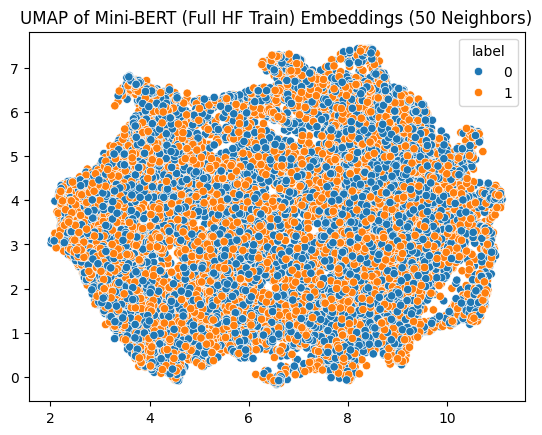

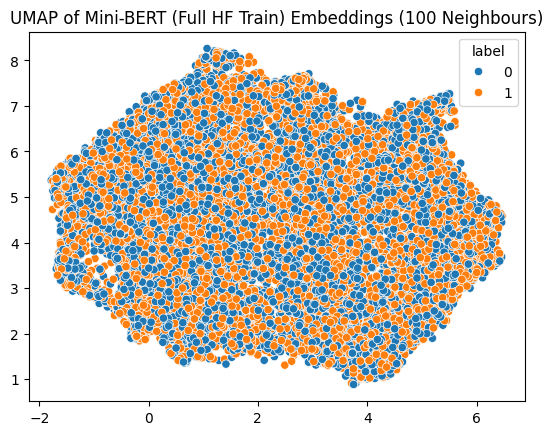

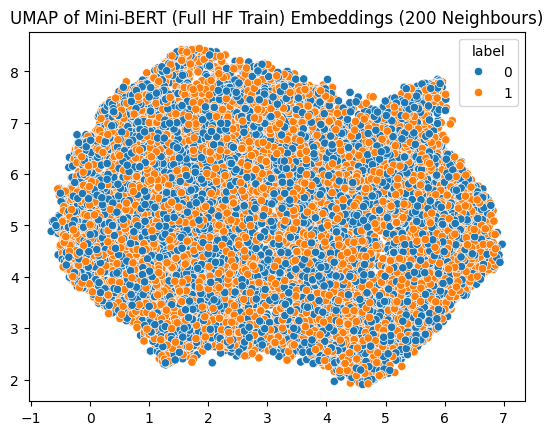

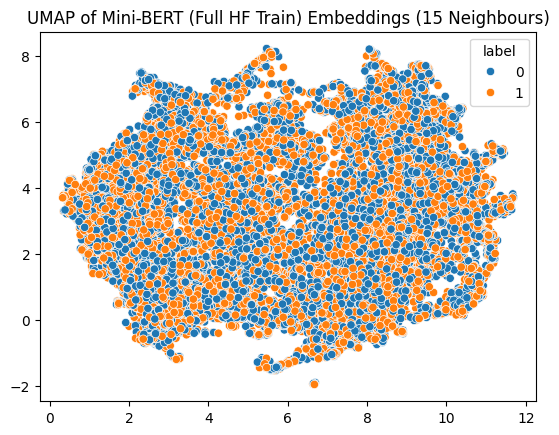

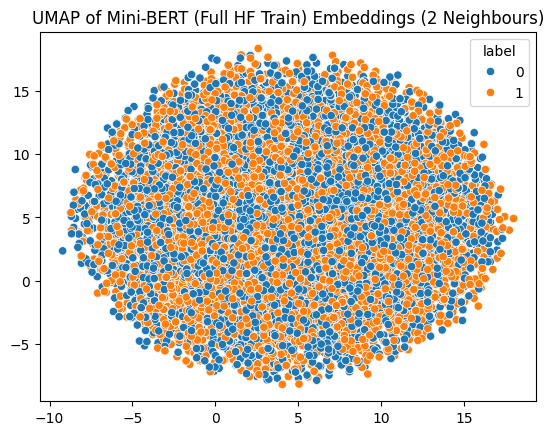

In [ ]:
# UMAP visualization
get_umaps(x_emb_minib_hf_train_big, hf_train_db_big, "Mini-BERT (Full HF Train)")

## BERT, Full HF dataset: Training, Evaluating, and Visualization

In [ ]:
# BERT, Full HF dataset
# Getting embeddings

# Getting training embeddings
x_emb_bb_hf_train_big = model.encode(x_hf_train_big, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_bb_hf_train_big.shape)

# Getting testing embeddings
x_emb_bb_hf_test_big = model.encode(x_hf_test_big, show_progress_bar=True)
print("Shape of embeddings: ", x_emb_bb_hf_test_big.shape)

Batches:   0%|          | 0/717 [00:00<?, ?it/s]

Shape of embeddings:  (22930, 384)


Batches:   0%|          | 0/180 [00:00<?, ?it/s]

Shape of embeddings:  (5732, 384)


Done training logistic regression model — Took Time (s): 2.9735054969787598
Done training random forest classifier — Took Time (s): 93.4136266708374
Done SVM classifier — Took Time (s): 587.4932715892792
Done training simple MLP — Took Time (s): 47.02630949020386
Mini-BERT, HF, Logistic Regression Model EVALUATION:
	Accuracy: 0.864
	Precision: 0.866
	Recall: 0.861
	F1 Score: 0.863


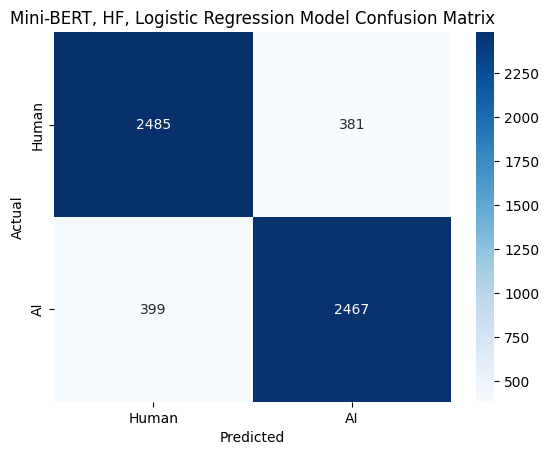

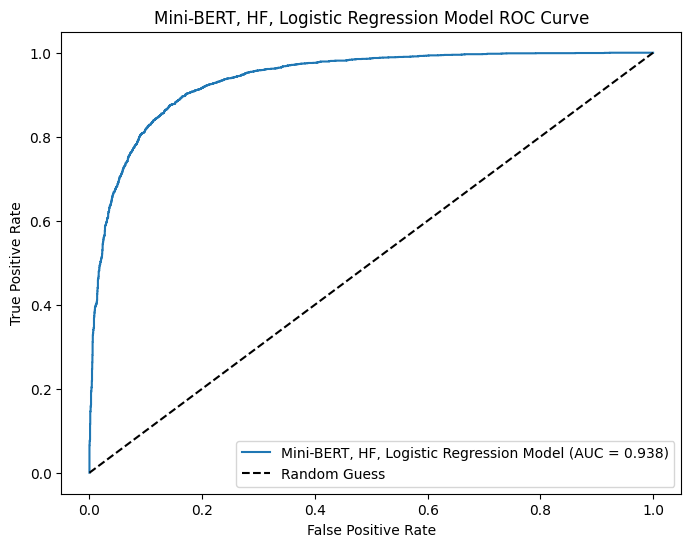

Mini-BERT, HF, Random Forest Classifier EVALUATION:
	Accuracy: 0.763
	Precision: 0.776
	Recall: 0.738
	F1 Score: 0.757


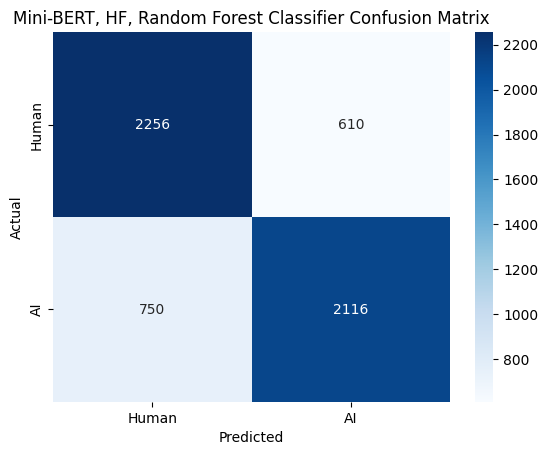

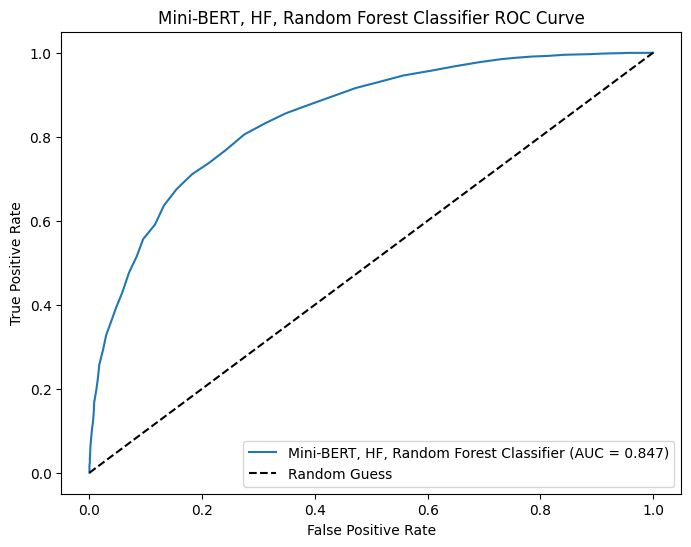

Mini-BERT, HF, Linear Support Vector Machine EVALUATION:
	Accuracy: 0.880
	Precision: 0.882
	Recall: 0.879
	F1 Score: 0.880


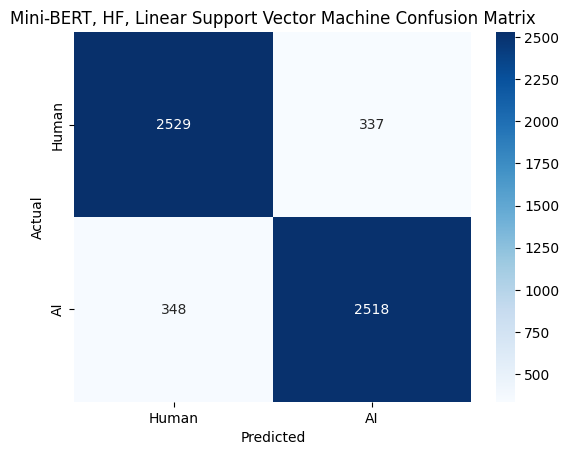

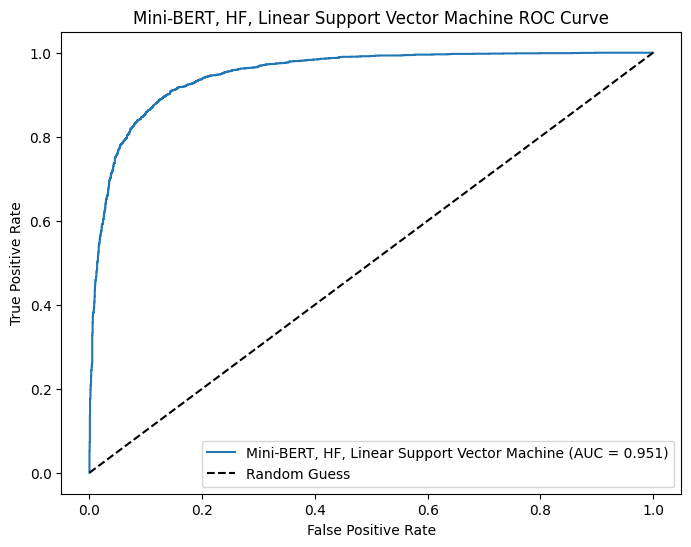

Mini-BERT, HF, Simple Multi-Layer Perceptron EVALUATION:
	Accuracy: 0.902
	Precision: 0.906
	Recall: 0.898
	F1 Score: 0.902


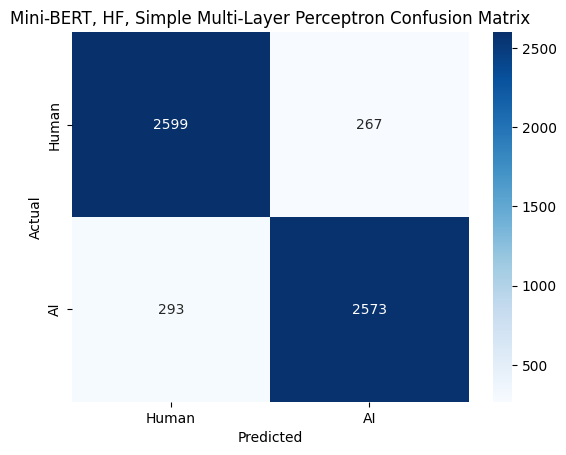

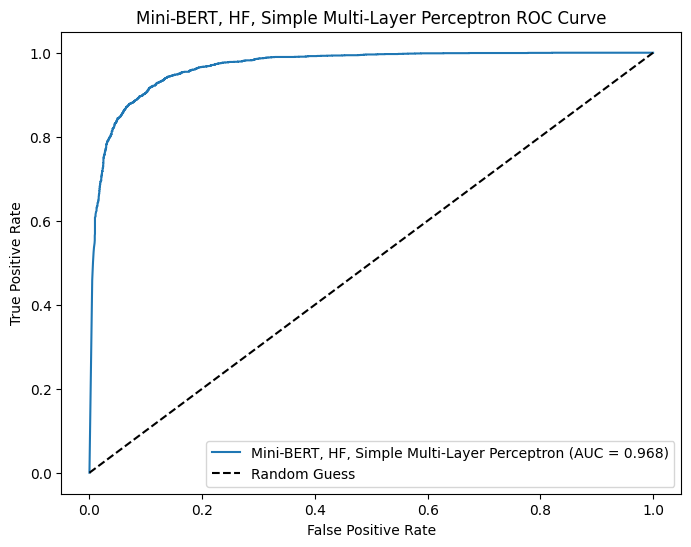

In [ ]:
# BERT, Full HF dataset
# Training and evaluating

# Training the four regressors using Mini-BERT and HF dataset
bb_log_regressor_hf_big = LogisticRegression(max_iter=1000)
bb_random_forest_hf_big = RandomForestClassifier(n_estimators=100, random_state=19)
bb_svm_hf_big = SVC(kernel='linear', probability=True, random_state=19)
bb_mlp_hf_big = MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=19)
bb_log_regressor_hf_big, bb_random_forest_hf_big, bb_svm_hf_big, bb_mlp_hf_big = train(log_regressor_hf_big,
                                                                                       bb_random_forest_hf_big, bb_svm_hf_big, bb_mlp_hf_big,
                                                                                       x_emb_bb_hf_train_big, y_hf_train_big)

# Evaluating the four models
evaluate(bb_log_regressor_hf_big, x_emb_bb_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Logistic Regression Model")
evaluate(bb_random_forest_hf_big, x_emb_bb_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Random Forest Classifier")
evaluate(bb_svm_hf_big, x_emb_bb_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Linear Support Vector Machine")
evaluate(bb_mlp_hf_big, x_emb_bb_hf_test_big, y_hf_test_big, "Mini-BERT, HF, Simple Multi-Layer Perceptron")

In [ ]:
# BERT, FULL HuggingFace
# Visualizations  t-SNE and PCA

# PCA visualization function
pca_visualize(x_emb_bb_hf, hf_train_db, "BERT (Full HF Train)")

# t-SNE visualizations
visualize_2d(x_emb_bb_hf_train_big, hf_train_db_big, "BERT (Full HF Train)")

Output hidden; open in https://colab.research.google.com to view.

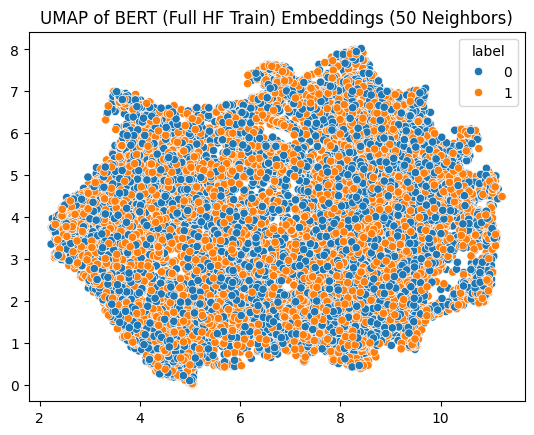

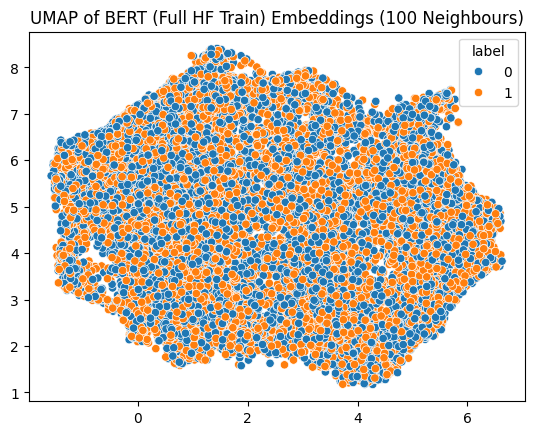

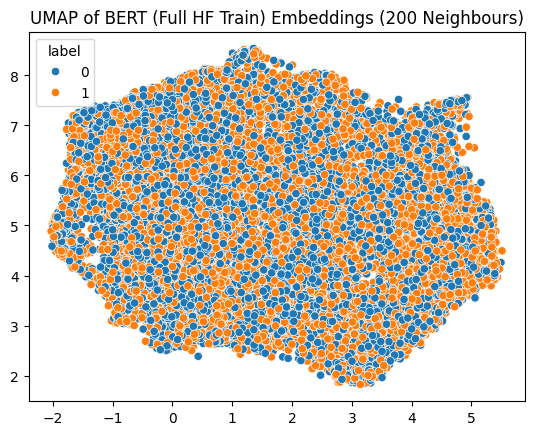

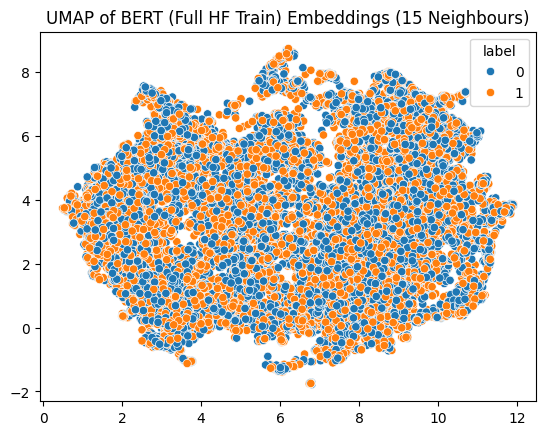

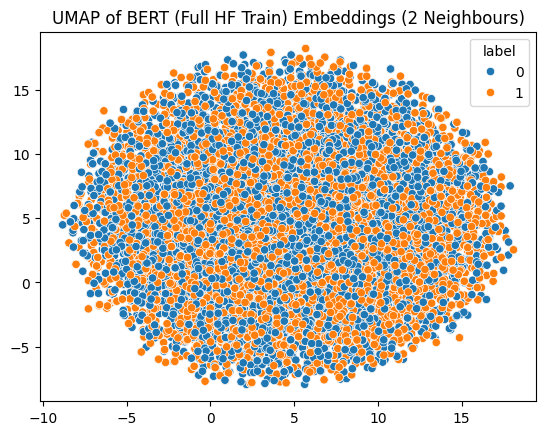

In [ ]:
# More visualizing
get_umaps(x_emb_bb_hf_train_big, hf_train_db_big, "BERT (Full HF Train)")